<a href="https://colab.research.google.com/github/huskeypm/herg/blob/main/herg_XF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Porpoise:**This notebooks allows an end-user to reproduce key figures in our hERG manuscript, based on 'feature' sets that have been procured from simulation and sequence analyses. Several statistical and machine learning processes are defined below. 

**Usage:** Hit shift-enter a buncho times to conduct the analyses and generate the corresponding figures.

Many of the analyses use routines that are imported from the herg git project that is cloned below. 

*Contact pkekeneshuskey@luc.edu for support*


Summary of data figures in paper
- Figs 2 and 3 are generated from gnu plot files included with git repo. Comparable data is displayed in [Section 1](#section_1)
- Version of Fig 5 is computed in [Section 1](#section_1)
- Table 1 can be reassembled from code outputs in [Section 2](#section_2)
- Figs 6-9 is based on outputs from [Section 2](#section_2)


Clone python libraries in support of this notebook 

In [1]:
#!git clone https://github.com/huskeypm/herg.git

In [2]:
#!pip3 install pydotplus
#!pip3 install mlxtend


In [3]:
#cd /content/herg


In [4]:
#!git pull 

In [5]:
if 0: 
  from google.colab import drive
  drive.mount('/content/drive')

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

import matplotlib.pylab as plt
import pandas as pd
import probUtil as dU
import mlUtil
import feature
import numpy as np

#from sklearn.cross_validation import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, plot_confusion_matrix, plot_roc_curve

from mlxtend.data import iris_data
from sklearn.utils import resample

import os
import math
from math import floor, ceil

# stuff for plotting trees
from six import StringIO
#from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from pandas.plotting import scatter_matrix
import seaborn as sns
from sklearn import datasets
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

from matplotlib import rcParams

Load feature set for PAS domain variants. Features are explained in readme [TODO] . Most features are computed offline and stored in a txt file that is included with the git repo

In [17]:
dataFile = "feature_sets/features-latest-sets1n2.txt"
df = pd.read_csv(dataFile, sep="\s+", comment='#')

# column E data
predictData = "feature_sets/cole_dataset.txt"
dfPred=pd.read_csv(predictData, sep="\s+", comment='#')


Add additional features. The imported library can be edited to conduct additional analyses

In [19]:
tags=["WATERS", "HBONDS", "RMSD", "SASA", "HELIX", "TURNS", "COILS", "THREE-TEN", "BETA"]
#tags=["WATERS", "HBONDS", "RMSD", "SASA", "HELIX", "TURNS", "BETA", "COILS", "THREE-TEN",# derived from MD 
tags+=["CONSERVATION","FOLDX", "HYDROPHOBICITY"] # derived from sequence
output = ["TRAFFICKING"]    
tags+=['APBS','SASASingleSite']

feature.CalcInitialAA(df,newTag="INITAA")
feature.Calccharge(df,newTag="CHARGE")
rmsf={
    'RMSF36TO41' : 'rmsf_sub2.txt',
    'RMSF87TO92' : 'rmsf_sub3.txt',
    'RMSF73TO78' : 'rmsf_sub4.txt',
    'RMSF115TO120' : 'rmsf_sub.txt'} 
for key,val in rmsf.items():
    print("feature_sets/%s"%val,key)
    #feature.CalcRMSFLoc(df,"feature_sets/rmsf_sub2.txt", newTag="RMSF36TO41")
    feature.CalcRMSFLoc(df,"feature_sets/%s"%val, newTag=key)
    feature.CalcRMSFLoc(dfPred,"feature_sets/%s"%val, newTag=key)
    tags+=[key]



# include also APBS and SASASingleSite
feature.CalcAPBS(df,'feature_sets/apbs.dat',newTag="APBS")
feature.CalcSASASingleSite(df,'feature_sets/sasaSingleSite.dat',newTag="SASASingleSite")
feature.CalcAPBS(dfPred,'feature_sets/apbs_colE.dat',newTag="APBS")
feature.CalcSASASingleSite(dfPred,'feature_sets/sasaSingleSite_colE.dat',newTag="SASASingleSite")

feature_sets/rmsf_sub2.txt RMSF36TO41
a80p  not found in input list
c64w-q61g  not found in input list
d102a  not found in input list
i96v  not found in input list
wt  not found in input list
l86p  not found in input list
t74p  not found in input list
v113g  not found in input list
l86r  not found in input list
v113e  not found in input list
v113p  not found in input list
a32t  not found in input list
a57p  not found in input list
a78p  not found in input list
a80p  not found in input list
a85v  not found in input list
c108r  not found in input list
c64a  not found in input list
c64f  not found in input list
c64i  not found in input list
c64l  not found in input list
c64m  not found in input list
c64w  not found in input list
c64w-c39g  not found in input list
c64w-q61g  not found in input list
c64y  not found in input list
c66g  not found in input list
d102a  not found in input list
e130k  not found in input list
e58a  not found in input list
e58d  not found in input list
e58g  not fo

R92L  not found in input list
R92L  not found in input list


In [4]:
# feature sets

### MD features ###
# set 1
tagsMD1=["WATERS", "HBONDS", "RMSD", "SASA", "HELIX", "TURNS", "COILS", "THREE-TEN", "BETA"]
# with also 'RMSF', 'APBS', and 'SASASingleSite'
tagsMD2=["WATERS", "HBONDS", "RMSD", "SASA", "HELIX", "TURNS", "COILS", "THREE-TEN", "BETA"]
for key,val in rmsf.items():
      tagsMD2+=[key]
tagsMD2+=['APBS','SASASingleSite']


### Bioinformatics features ###
tagsBio=["HYDROPHOBICITY", "FOLDX", "CONSERVATION"]


### All features ###
# set 1
tagsAll1=tagsMD1+tagsBio
# with also 'RMSF', 'APBS', and 'SASASingleSite'
tagsAll2=tagsMD2+tagsBio

Display the first few variants and their corresponding features

### visualize data

In [5]:
df

,VARIANT,HELIX,TURNS,COILS,THREE-TEN,BETA,ISOLATED,RMSD,HBONDS,SASA,...,HYDROPHOBICITY,CLASS,TRAFFICKING,INITAA,RMSF36TO41,RMSF87TO92,RMSF73TO78,RMSF115TO120,APBS,SASASingleSite
0,a32t,21.1567,21.2058,14.4202,3.29401,39.6439,0.279349,1.23560,66.7186,6473.83,...,-0.43,1,1,0,1.36,0.80,0.79,1.94,-10837.766667,-4.01359
1,a57p,20.4290,21.8332,14.5935,3.53135,39.4690,0.144014,1.28151,66.0936,6477.76,...,-0.32,0,1,0,1.16,0.75,0.86,1.56,-13412.700000,101.72733
2,a78p,20.8206,21.3096,14.5379,3.19232,39.9190,0.220522,1.12505,65.8526,6479.56,...,-0.32,1,1,0,1.23,0.82,0.85,1.67,-13561.266667,28.40966
3,a85v,20.8686,21.4237,14.6775,3.12031,39.6774,0.232523,1.16450,65.4562,6544.62,...,0.29,1,1,0,1.31,0.87,0.88,1.52,-14364.766667,16.12533
4,c108r,22.1452,21.1476,15.3975,2.75727,38.2283,0.324033,1.58552,62.7131,6753.12,...,-1.84,1,0,1,1.30,0.91,1.14,1.53,-14268.533333,14.51022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,v94g,21.3471,21.1671,14.3579,2.88329,39.9415,0.303030,1.15005,67.0823,6481.89,...,-0.38,1,0,17,1.27,0.93,1.00,1.63,-15318.233333,21.69200
71,wt,19.4789,21.9577,14.7117,3.29257,40.5025,0.056664,1.09132,66.7740,6568.87,...,0.00,0,1,20,1.12,1.35,0.83,1.51,-16051.300130,0.00000
72,y43c,21.0411,21.3291,14.3204,2.88329,40.1875,0.238524,1.14731,65.0498,6467.45,...,0.02,1,0,19,1.48,0.91,0.88,1.59,-13976.300000,54.30720
73,y54h,21.4147,21.2601,14.9385,2.89979,39.3144,0.172517,1.33484,65.8552,6512.28,...,-0.42,1,1,19,1.52,0.87,0.86,1.88,-16184.900000,30.63473


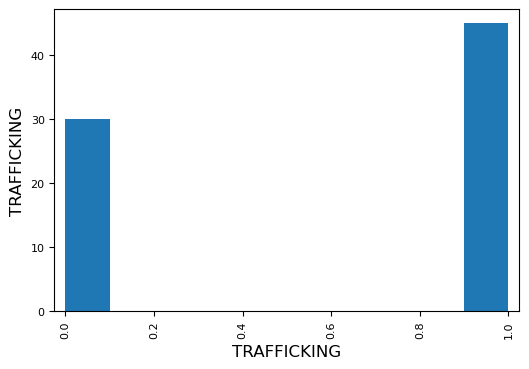

In [62]:
Y=df[['TRAFFICKING']]
scatter_matrix(Y)
#plt.show()
plt.savefig('target-data-distribution.pdf')

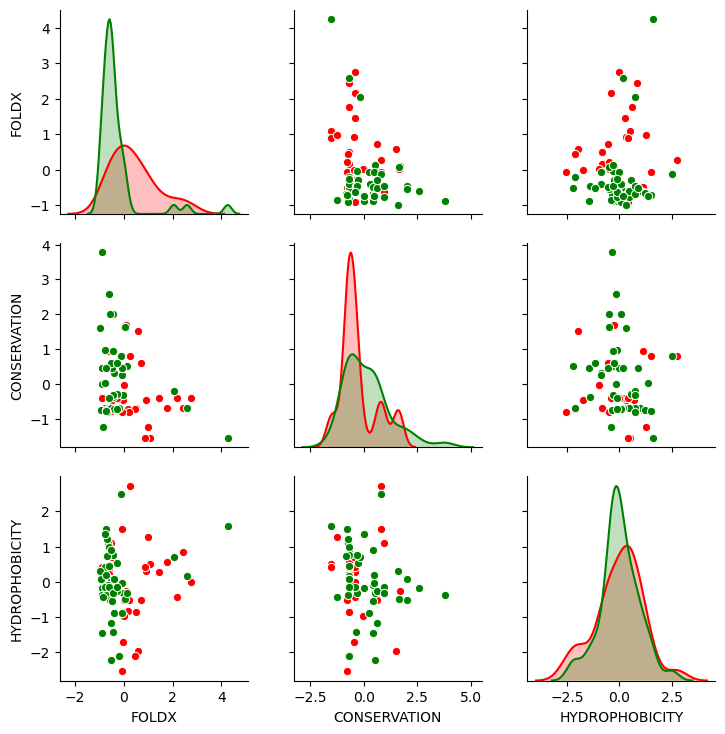

In [10]:
tagsPlot=tagsBio+['TRAFFICKING']
df_BIO = df[tagsPlot]
df_BIO_zscore=df_BIO.copy()
for col in df_BIO.columns:
    zs=dU.CalcZScore(df_BIO,tag=col)
    df_BIO_zscore[col]=zs
plot = sns.pairplot(df_BIO_zscore, hue='TRAFFICKING', palette=['Red', 'Green'],vars=['FOLDX', 'CONSERVATION', 'HYDROPHOBICITY']) 
plot._legend.remove()
plt.savefig('bioinformatics-data-distribution2.pdf')

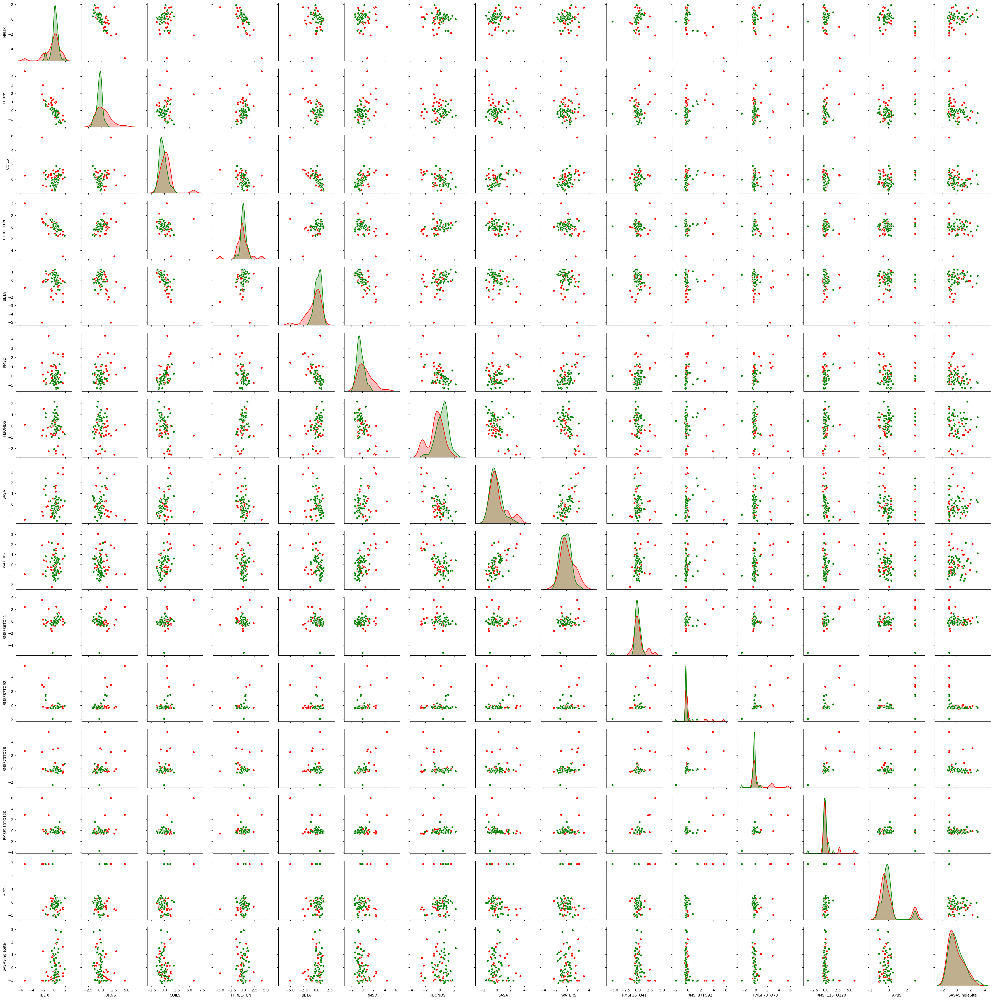

In [14]:
tagsPlot=tagsMD2+['TRAFFICKING']
df_MD = df[tagsPlot]
df_MD_zscore=df_MD.copy()
for col in df_MD.columns:
    df_MD_zscore[col]=dU.CalcZScore(df_MD,tag=col)
plot = sns.pairplot(df_MD_zscore, hue='TRAFFICKING', palette=['Red', 'Green'],vars=["HELIX","TURNS","COILS","THREE-TEN","BETA","RMSD","HBONDS","SASA","WATERS",'RMSF36TO41','RMSF87TO92','RMSF73TO78','RMSF115TO120','APBS','SASASingleSite']) 
plot._legend.remove()
plt.savefig('md-data-distribution2.pdf')


In [13]:
tagsPlot

['WATERS',
 'HBONDS',
 'RMSD',
 'SASA',
 'HELIX',
 'TURNS',
 'COILS',
 'THREE-TEN',
 'BETA',
 'RMSF36TO41',
 'RMSF87TO92',
 'RMSF73TO78',
 'RMSF115TO120',
 'APBS',
 'SASASingleSite',
 'TRAFFICKING']

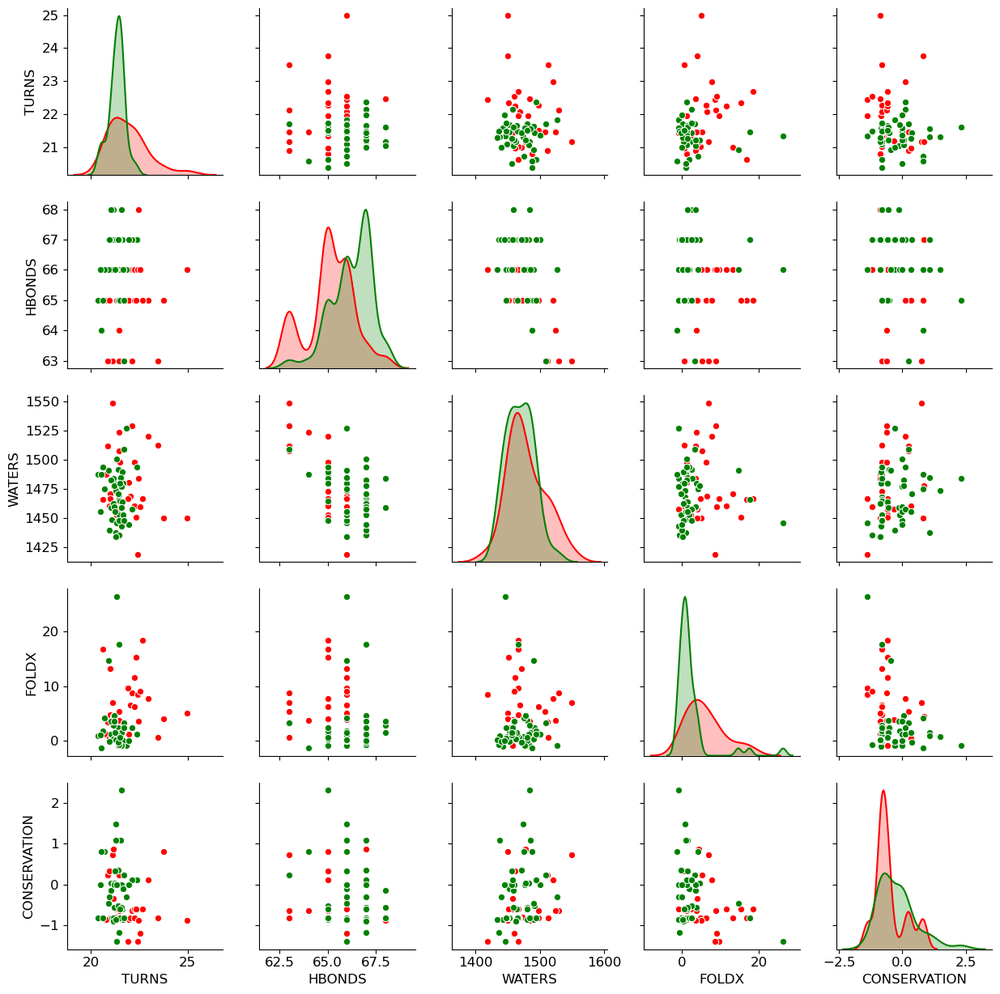

In [65]:
df_best = df[["TURNS","HBONDS","WATERS", "FOLDX", "CONSERVATION", "TRAFFICKING"]]
df_best_zscore=df_best.copy()
for col in df_best.columns:
    df_best_zscore[col]=dU.CalcZScore(df_best,tag=col)
plot = sns.pairplot(df_best, hue='TRAFFICKING', palette=['Red', 'Green'],vars=["TURNS","HBONDS","WATERS", "FOLDX", "CONSERVATION"]) 
plot._legend.remove()

#b = sns.violinplot(y = "Draughts", data = df)
#b.set_yticklabels(b.get_yticks(), size = 15)

plt.savefig('best-data-distribution2.pdf')


In [5]:
display=True  
random_state=50
rcParams['figure.dpi']=100#60

### Section 1: Build and Apply probabilistic classifier 

<a id=’section_1’></a>
[UNDER CONSTRUCTION]
Defines a conditional probability (see methods in the hERG paper) for each feature that represents the likelihood a variant is nontrafficking if its feature value is above some value. 

Displays 
- distribution of variants according to a given feature (converted to z-scores). Green are trafficking; red are non-trafficking. 
- All conditional probs are shown in one graph (Cond. probability)
- ROC curve gives the true and false positive rates for identifying a non-trafficking variant. 
- Also shown is a plot for the true/false positive/negative rates, but this is currently INCORRECT

Prints out
- indi_condprob_md.pdf; 
- roc_conditional_probability 
in the local file directory.

In [6]:
cases = dict() # for storing all outputs 

/home/xfang/repos/herg/probUtil.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:159: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/anaconda3/lib/pyth

TESTING  stats
Accuracy(NT) 0.782608695652174
Precision(NT) 1.0
Recall(NT) 0.4444444444444444
F1 score(NT) 0.6153846153846154
Accuracy(T) 0.782608695652174
Precision(T) 0.7368421052631579
Recall(T) 1.0
F1 score(T) 0.8484848484848485


/home/xfang/repos/herg/probUtil.py:236: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:236: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:389: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probU

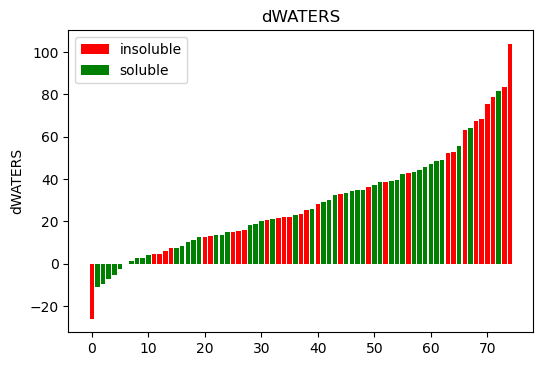

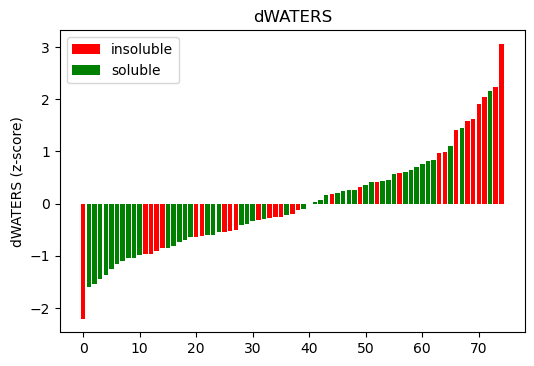

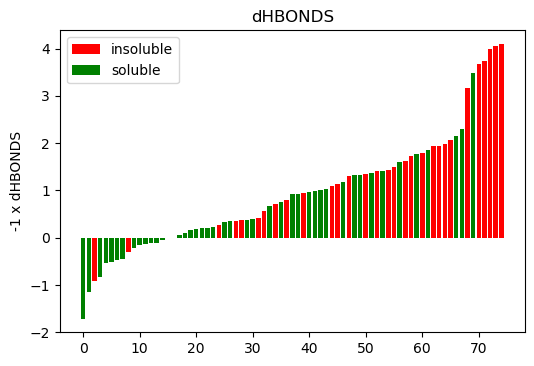

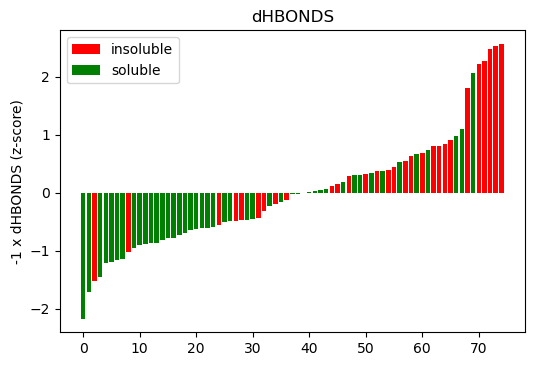

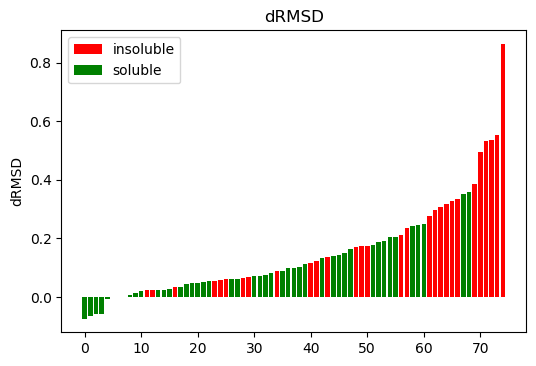

...

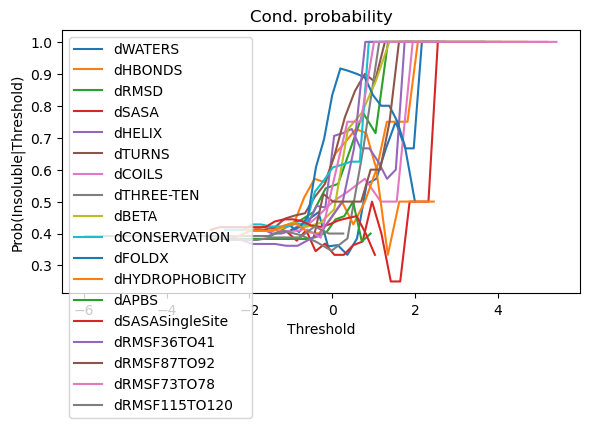

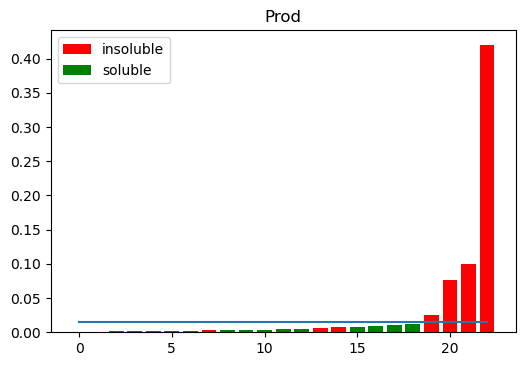

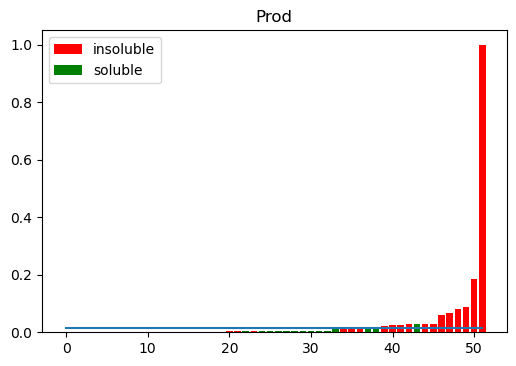

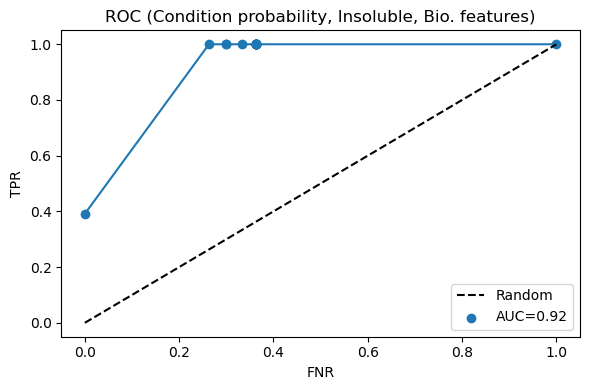

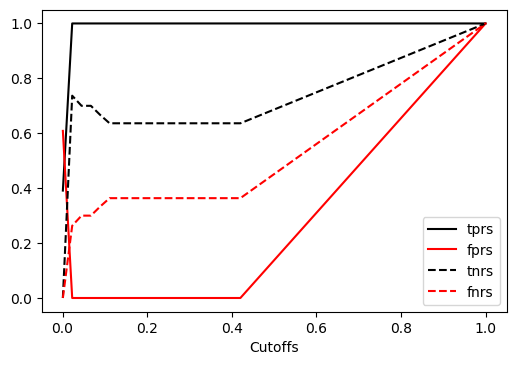

In [13]:
outputs = dU.ProbClassifier(df,tags,display=display,split=True)
cases['Prob'] = outputs

/home/xfang/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s
/home/xfang/repos/herg/probUtil.py:236: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


TESTING  stats
Accuracy(NT) 0.6956521739130435
Precision(NT) 0.625
Recall(NT) 0.5555555555555556
F1 score(NT) 0.5882352941176471
Accuracy(T) 0.6956521739130435
Precision(T) 0.7333333333333333
Recall(T) 0.7857142857142857
F1 score(T) 0.7586206896551724


/home/xfang/repos/herg/probUtil.py:389: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:402: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


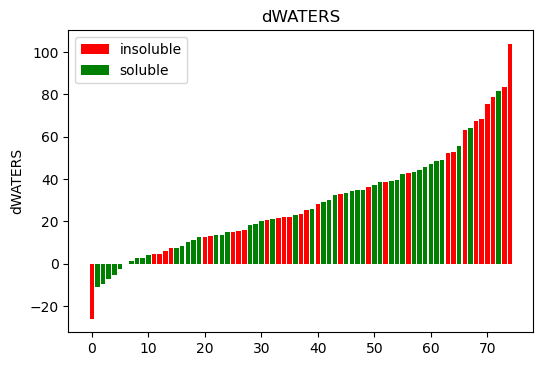

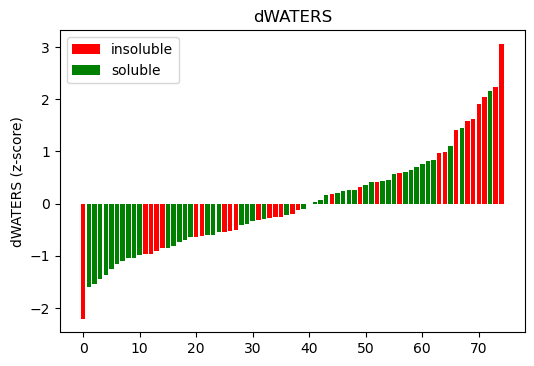

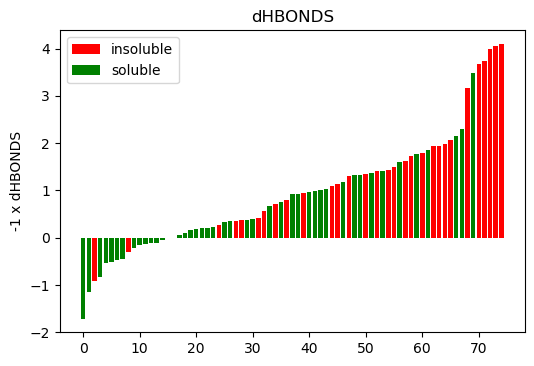

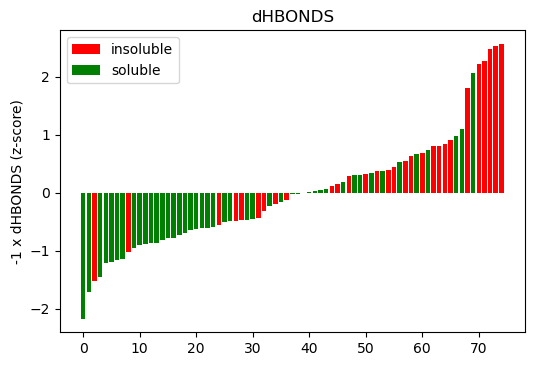

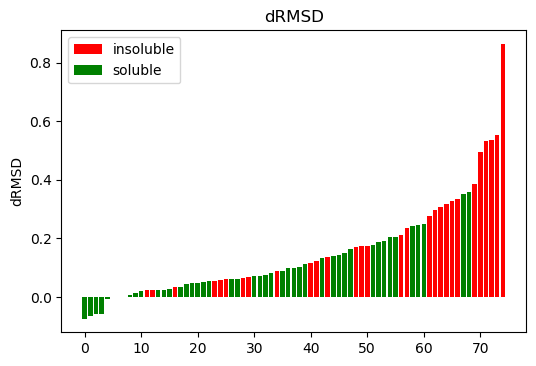

...

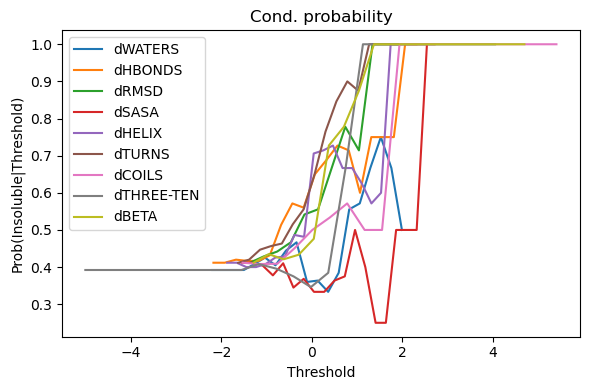

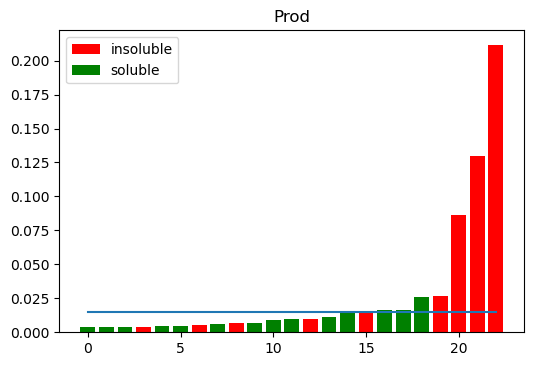

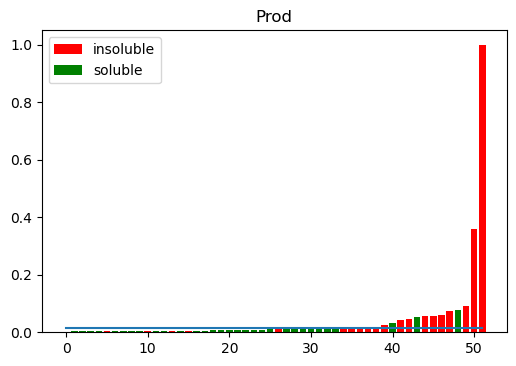

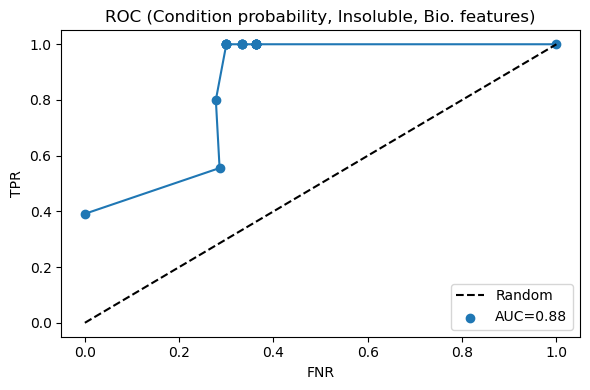

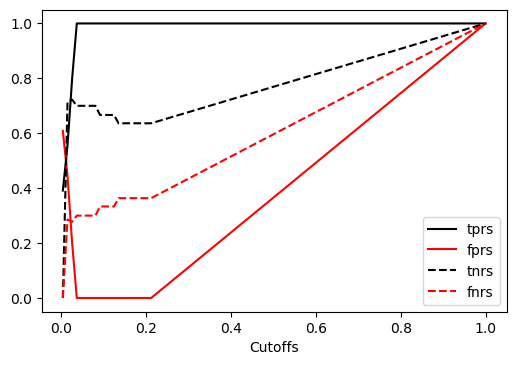

In [14]:
# MD features
# representative ROC and prod
outputs = dU.ProbClassifier(df,tagsMD1,display=display,split=True,bootstrap=False)

/home/xfang/repos/herg/probUtil.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Bootstrap with  500


/home/xfang/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


AUC:  0.746018947936041
       accT     precT      recT       f1T       acc      prec       rec  \
0  0.652174  0.652174  1.000000  0.789474  0.652174  0.000000  0.000000   
1  0.565217  0.600000  0.857143  0.705882  0.565217  0.333333  0.111111   
2  0.608696  0.571429  1.000000  0.727273  0.608696  1.000000  0.181818   
3  0.652174  0.619048  1.000000  0.764706  0.652174  1.000000  0.200000   
4  0.565217  0.565217  1.000000  0.722222  0.565217  0.000000  0.000000   

         f1  AccTraining  AccTesting  
0  0.000000     0.653846    0.652174  
1  0.166667     0.692308    0.565217  
2  0.307692     0.692308    0.608696  
3  0.333333     0.692308    0.652174  
4  0.000000     0.711538    0.565217  
accT avg:  0.635565217391305
precT avg:  0.6369331860277134
recT avg:  0.9212945633056312
f1T avg:  0.7445872342712725
acc avg:  0.635565217391305
prec avg:  0.6338919022154319
rec avg:  0.23524699467199475
f1 avg:  0.3122820537541165
AccTraining avg:  0.698769230769228
AccTesting avg:  0.6

/home/xfang/repos/herg/probUtil.py:389: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:402: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


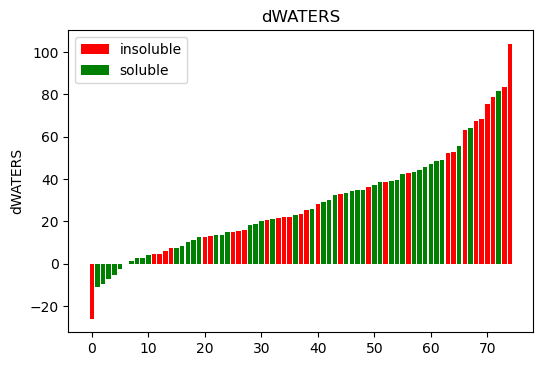

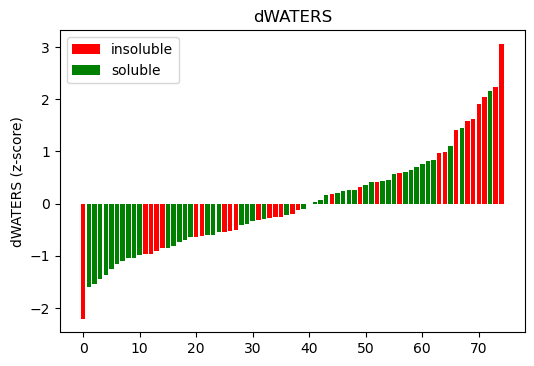

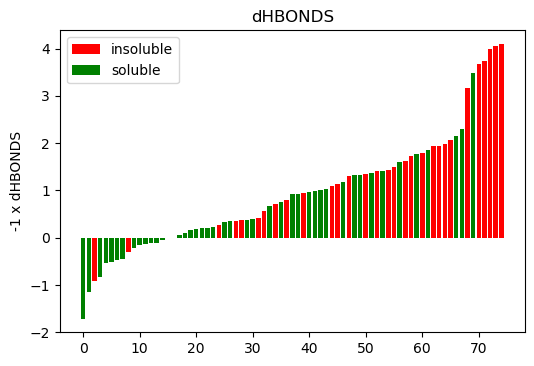

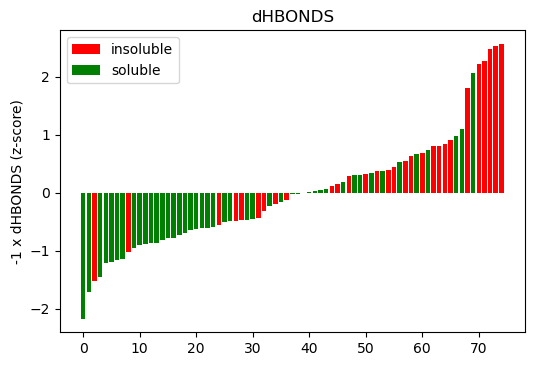

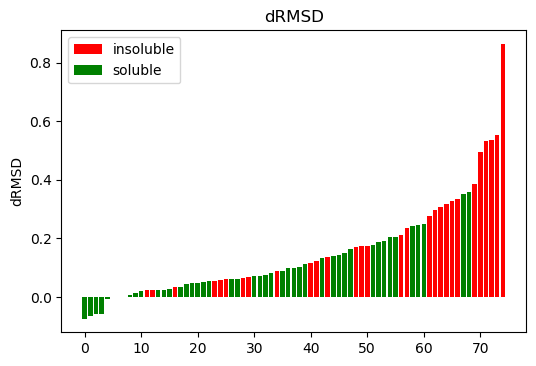

...

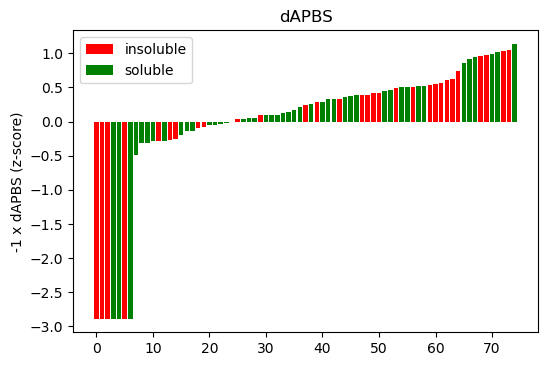

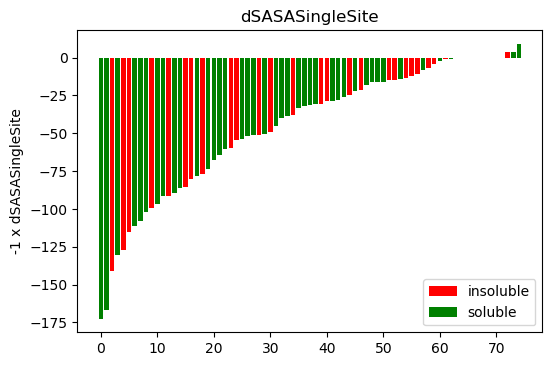

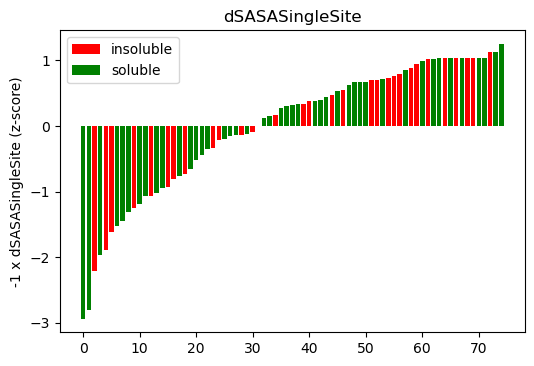

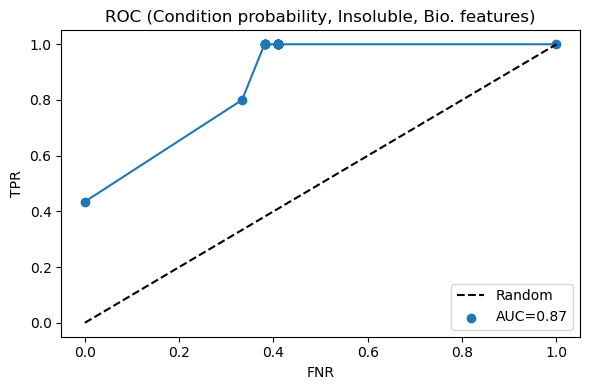

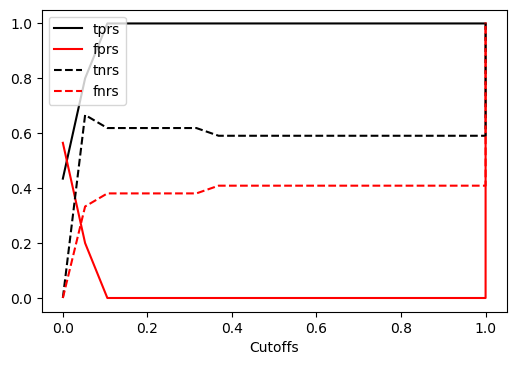

In [15]:
# MD features
outputs = dU.ProbClassifier(df,tagsMD2,display=display,split=True,bootstrap=True)

/home/xfang/repos/herg/probUtil.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:159: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/anaconda3/lib/pyth

TESTING  stats
Accuracy(NT) 0.782608695652174
Precision(NT) 1.0
Recall(NT) 0.4444444444444444
F1 score(NT) 0.6153846153846154
Accuracy(T) 0.782608695652174
Precision(T) 0.7368421052631579
Recall(T) 1.0
F1 score(T) 0.8484848484848485


/home/xfang/repos/herg/probUtil.py:236: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:236: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:389: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probU

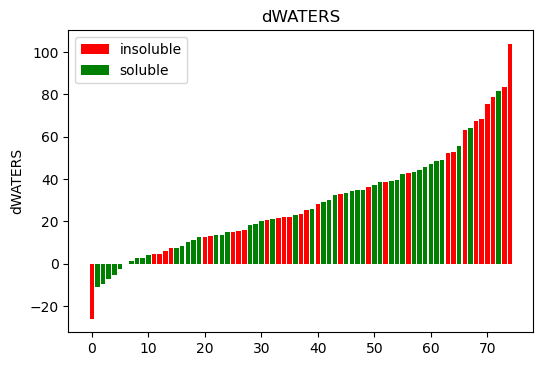

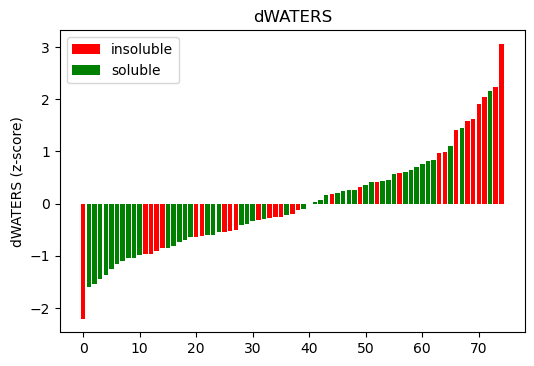

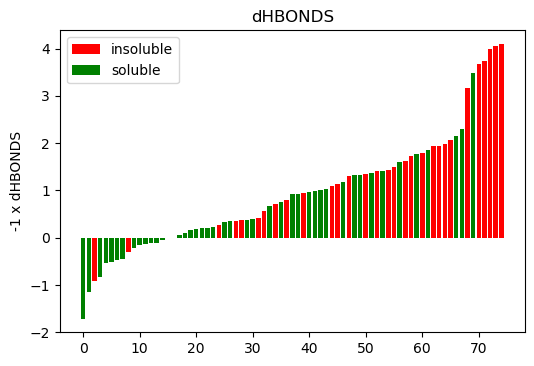

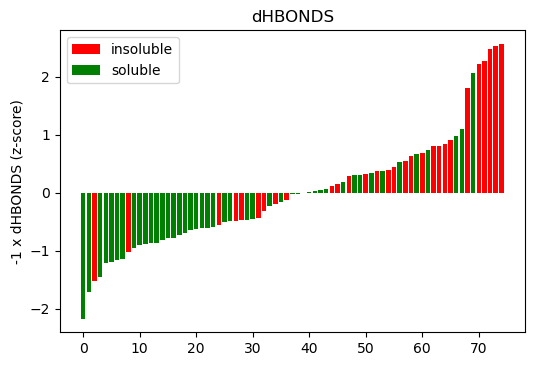

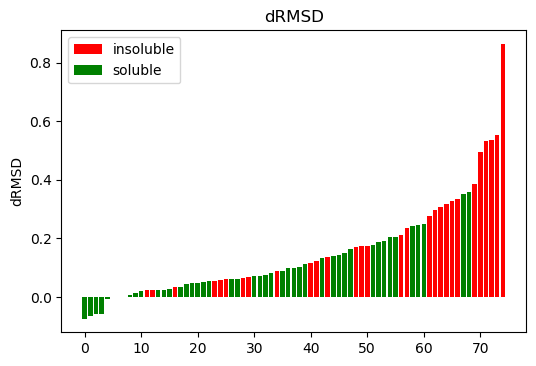

...

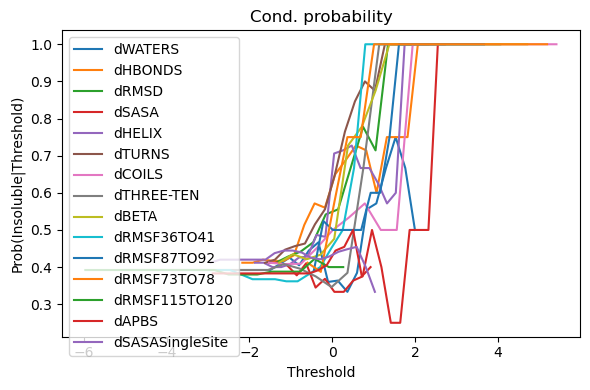

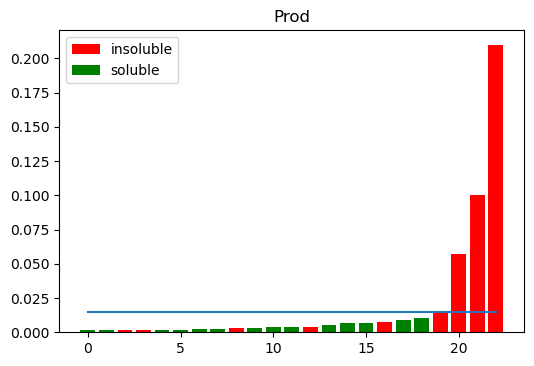

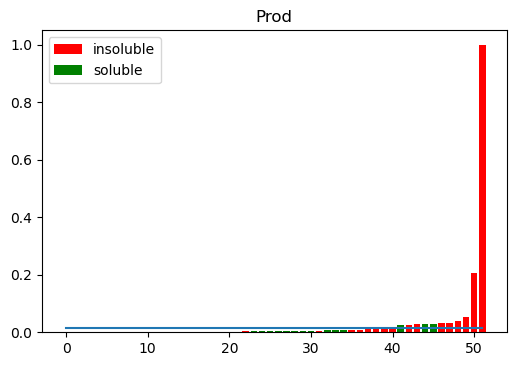

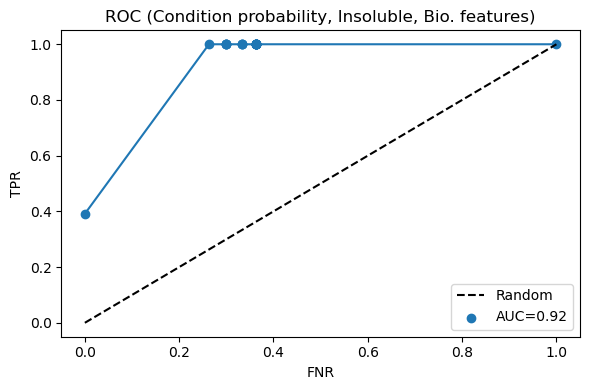

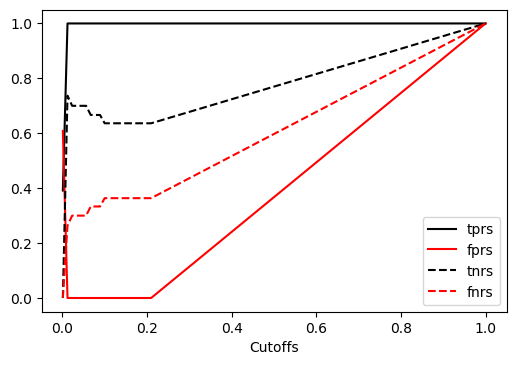

In [16]:
# MD features
# representative ROC and prod
outputs = dU.ProbClassifier(df,tagsMD2,display=display,split=True,bootstrap=False)

Bootstrap with  500


/home/xfang/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


AUC:  0.551008754982492
       accT  precT  recT  f1T       acc      prec       rec        f1  \
0  0.391304    0.0   0.0  0.0  0.391304  0.391304  1.000000  0.562500   
1  0.304348    0.0   0.0  0.0  0.304348  0.333333  0.777778  0.466667   
2  0.391304    0.0   0.0  0.0  0.391304  0.391304  1.000000  0.562500   
3  0.260870    0.0   0.0  0.0  0.260870  0.272727  0.857143  0.413793   
4  0.434783    0.0   0.0  0.0  0.434783  0.434783  1.000000  0.606061   

   AccTraining  AccTesting  
0     0.423077    0.391304  
1     0.442308    0.304348  
2     0.423077    0.391304  
3     0.461538    0.260870  
4     0.384615    0.434783  
accT avg:  0.37113043478261043
precT avg:  0.06808095238095234
recT avg:  0.016940461172814104
f1T avg:  0.02612603552278472
acc avg:  0.37113043478261043
prec avg:  0.38083671314028794
rec avg:  0.9005891164391167
f1 avg:  0.5289955118666777
AccTraining avg:  0.42257692307692307
AccTesting avg:  0.37113043478261043


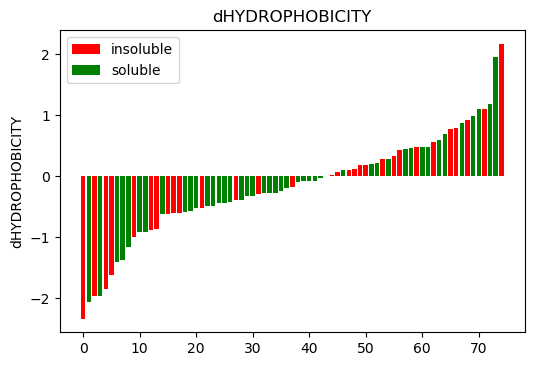

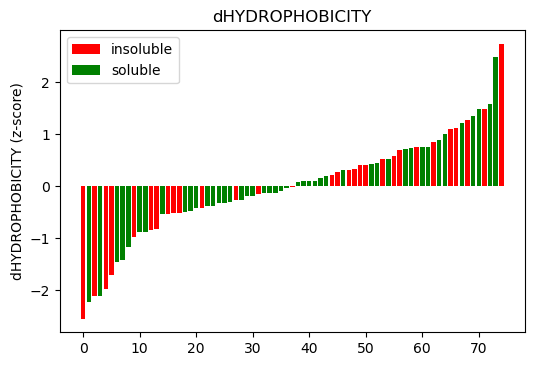

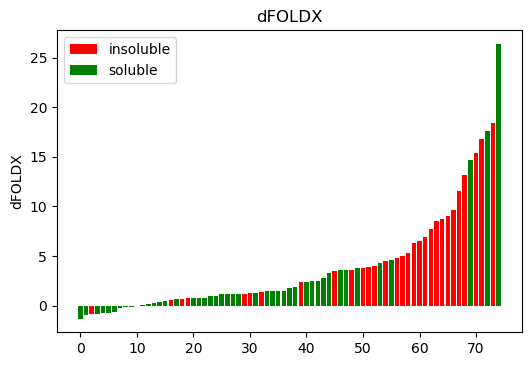

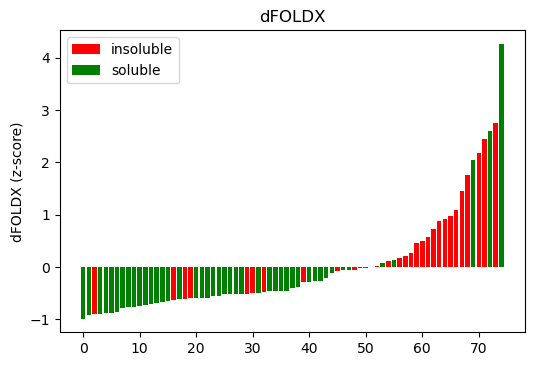

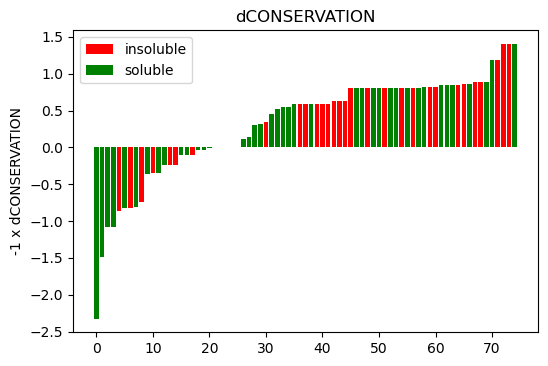

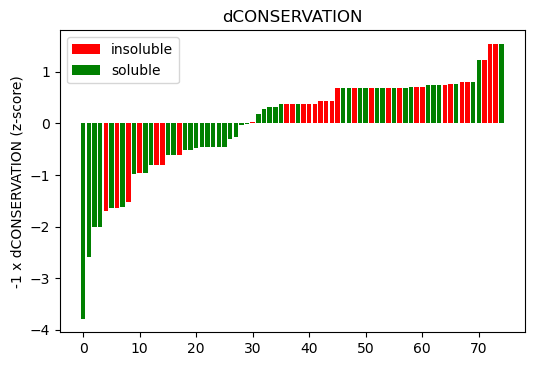

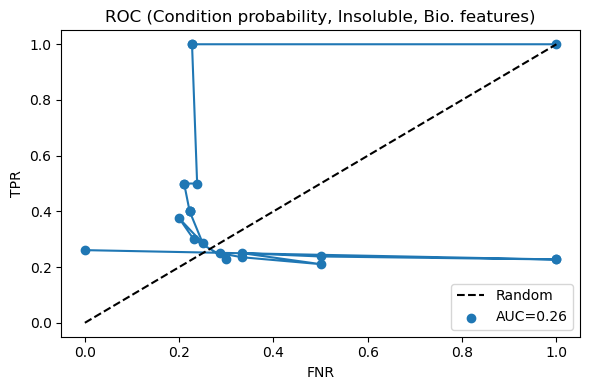

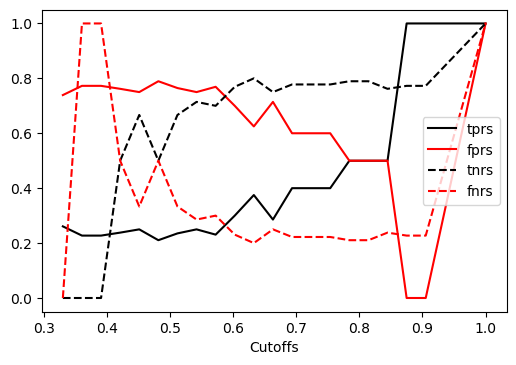

In [17]:
# Bioinformatics features
outputs = dU.ProbClassifier(df,tagsBio,display=display,split=True,bootstrap=True)

/home/xfang/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


TESTING  stats
Accuracy(NT) 0.391304347826087
Precision(NT) 0.391304347826087
Recall(NT) 1.0
F1 score(NT) 0.5625
Accuracy(T) 0.391304347826087
Precision(T) 0.0
Recall(T) 0.0
F1 score(T) 0.0


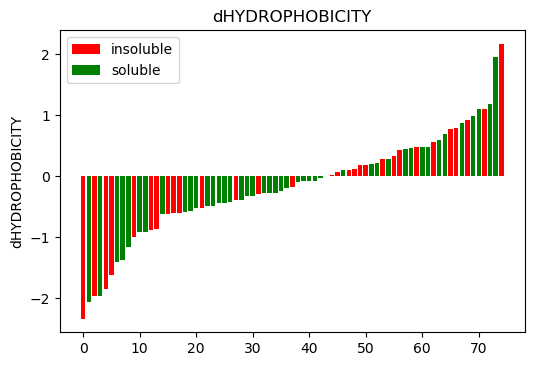

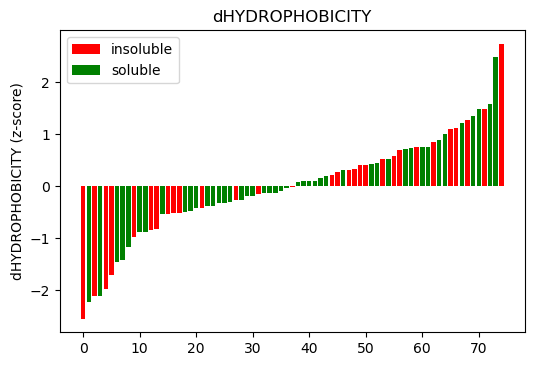

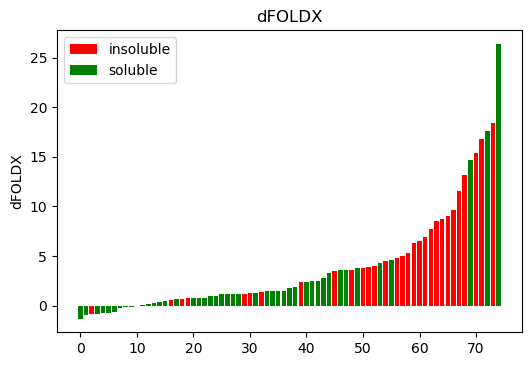

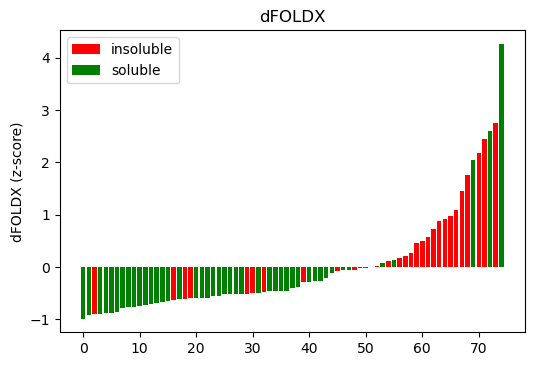

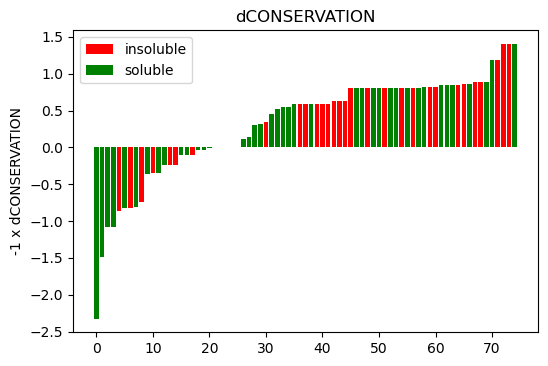

...

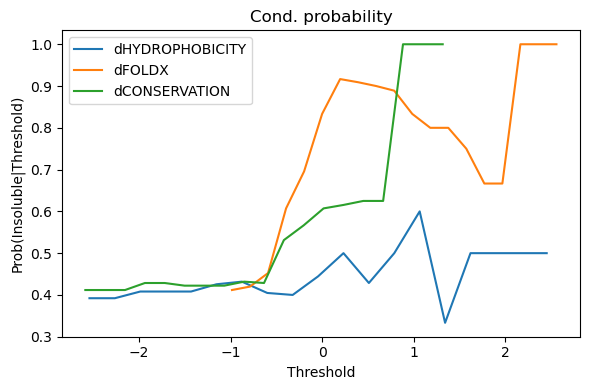

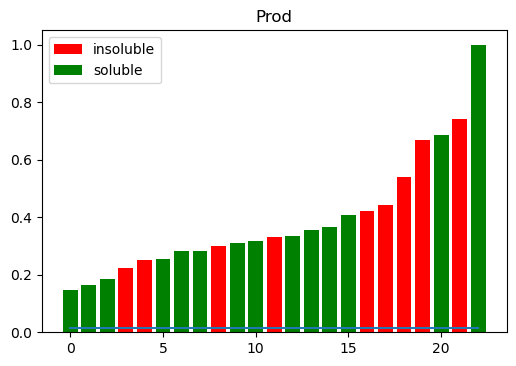

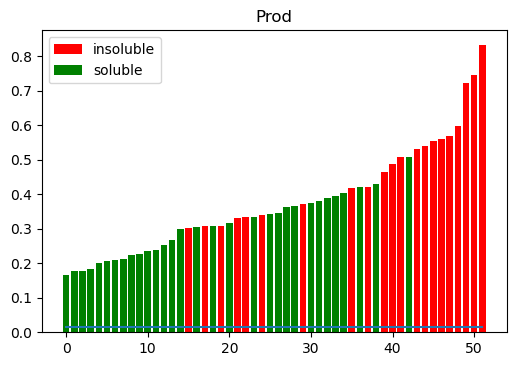

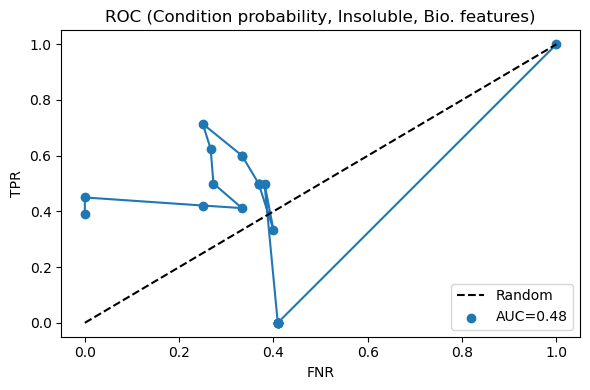

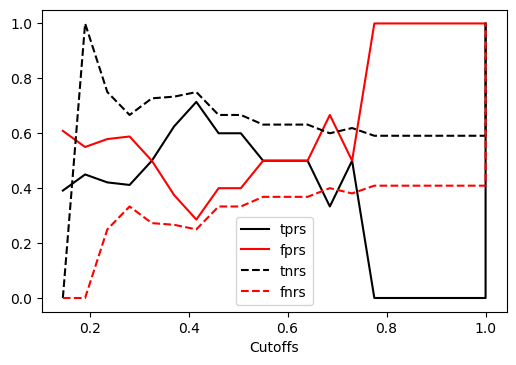

In [18]:
# Bio features
# representative ROC and prod
outputs = dU.ProbClassifier(df,tagsBio,display=display,split=True,bootstrap=False)

/home/xfang/repos/herg/probUtil.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Bootstrap with  500


/home/xfang/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


AUC:  0.7516877453947659
       accT     precT      recT       f1T       acc      prec       rec  \
0  0.826087  0.882353  0.882353  0.882353  0.826087  0.666667  0.666667   
1  0.695652  0.705882  0.857143  0.774194  0.695652  0.666667  0.444444   
2  0.608696  0.526316  1.000000  0.689655  0.608696  1.000000  0.307692   
3  0.869565  0.823529  1.000000  0.903226  0.869565  1.000000  0.666667   
4  0.826087  0.823529  0.933333  0.875000  0.826087  0.833333  0.625000   

         f1  AccTraining  AccTesting  
0  0.666667     0.711538    0.826087  
1  0.533333     0.711538    0.695652  
2  0.470588     0.730769    0.608696  
3  0.800000     0.750000    0.869565  
4  0.714286     0.769231    0.826087  
accT avg:  0.6722608695652191
precT avg:  0.6858623176299475
recT avg:  0.8605738769830108
f1T avg:  0.7525210062623165
acc avg:  0.6722608695652191
prec avg:  0.7021473967209269
rec avg:  0.4168449050949059
f1 avg:  0.4884083469072768
AccTraining avg:  0.756807692307693
AccTesting avg:  0

/home/xfang/repos/herg/probUtil.py:389: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:402: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


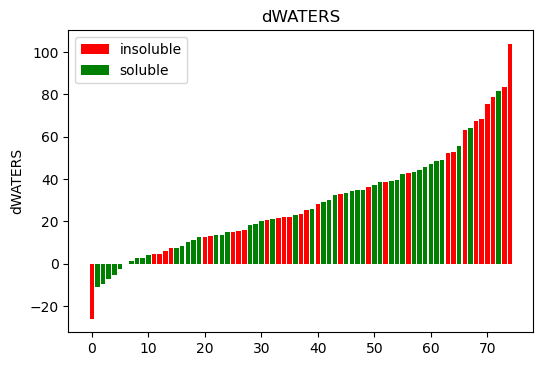

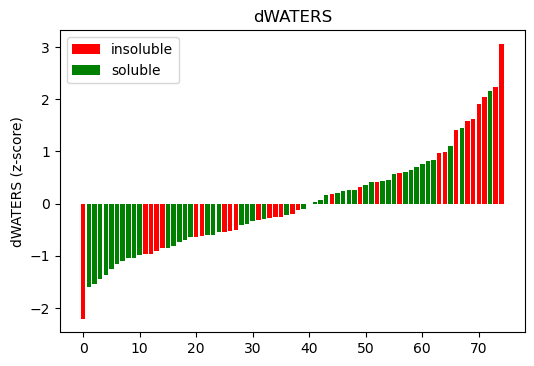

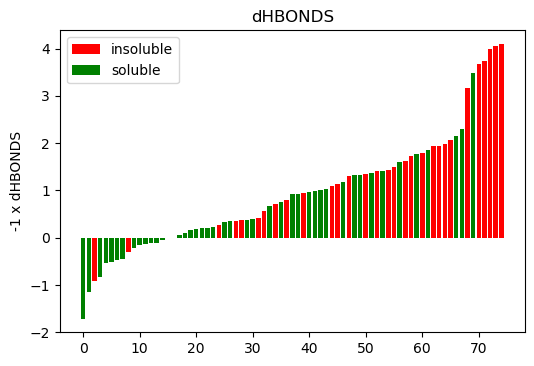

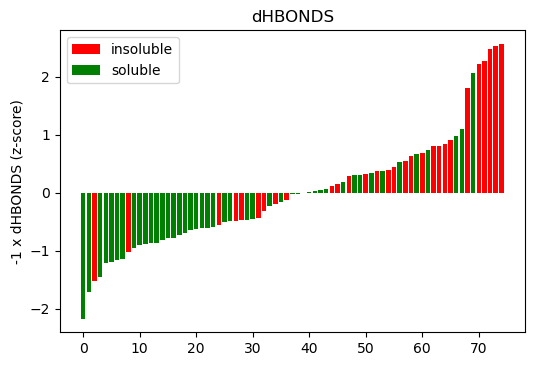

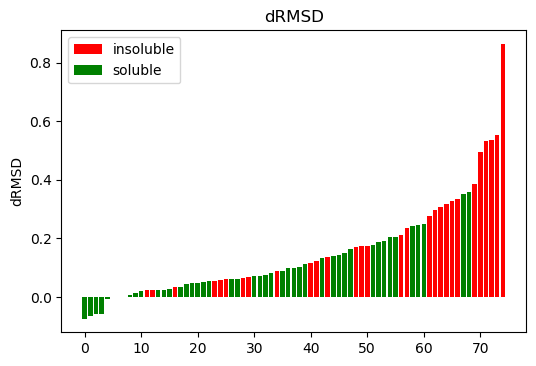

...

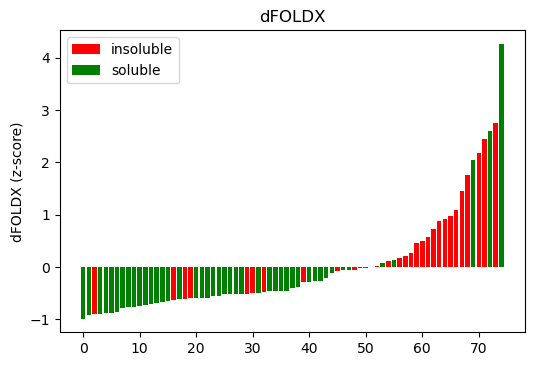

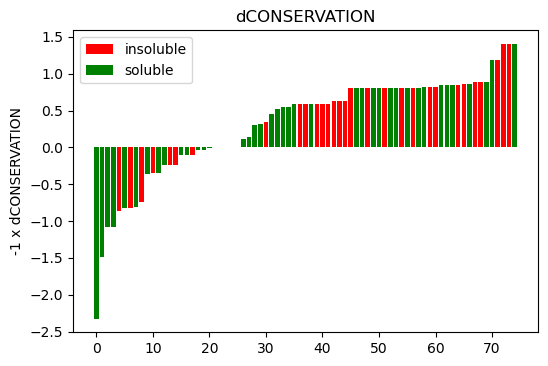

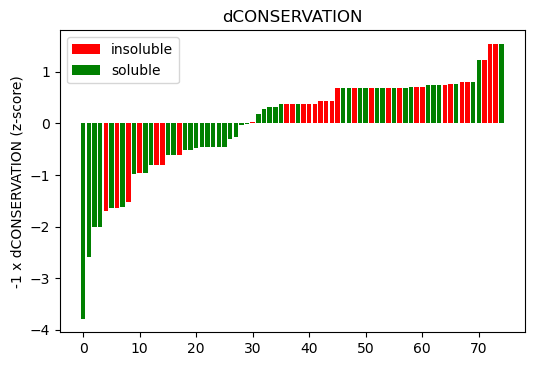

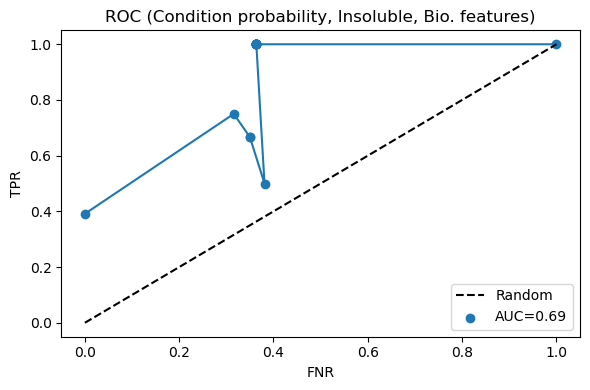

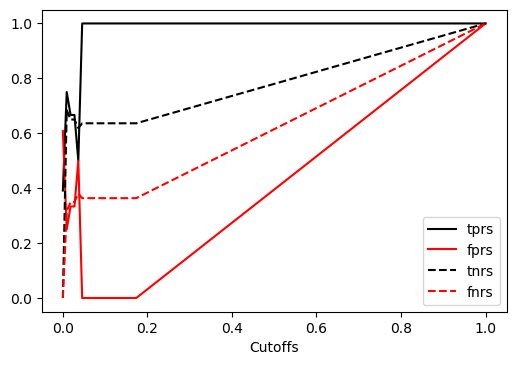

In [19]:
# All features
outputs = dU.ProbClassifier(df,tagsAll1,display=display,split=True,bootstrap=True)

/home/xfang/repos/herg/probUtil.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Bootstrap with  500


/home/xfang/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


AUC:  0.7368768809513528
       accT     precT      recT       f1T       acc  prec       rec        f1  \
0  0.608696  0.590909  1.000000  0.742857  0.608696   1.0  0.100000  0.181818   
1  0.565217  0.578947  0.846154  0.687500  0.565217   0.5  0.200000  0.285714   
2  0.521739  0.521739  1.000000  0.685714  0.521739   0.0  0.000000  0.000000   
3  0.739130  0.714286  1.000000  0.833333  0.739130   1.0  0.250000  0.400000   
4  0.608696  0.571429  1.000000  0.727273  0.608696   1.0  0.181818  0.307692   

   AccTraining  AccTesting  
0     0.692308    0.608696  
1     0.730769    0.565217  
2     0.730769    0.521739  
3     0.653846    0.739130  
4     0.673077    0.608696  
accT avg:  0.6399130434782621
precT avg:  0.6421483765688397
recT avg:  0.9280706979295215
f1T avg:  0.7510120472302223
acc avg:  0.6399130434782621
prec avg:  0.6497169941169947
rec avg:  0.2306765512265516
f1 avg:  0.31080024581541665
AccTraining avg:  0.7109999999999974
AccTesting avg:  0.6399130434782621


/home/xfang/repos/herg/probUtil.py:389: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:402: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


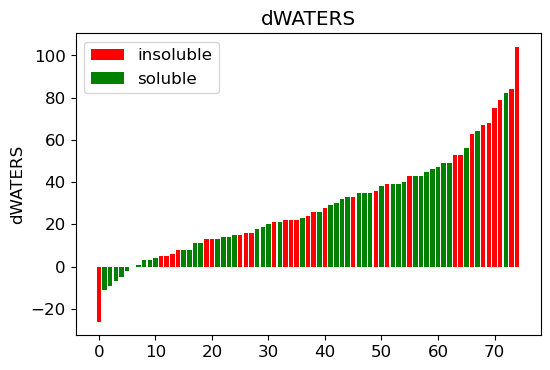

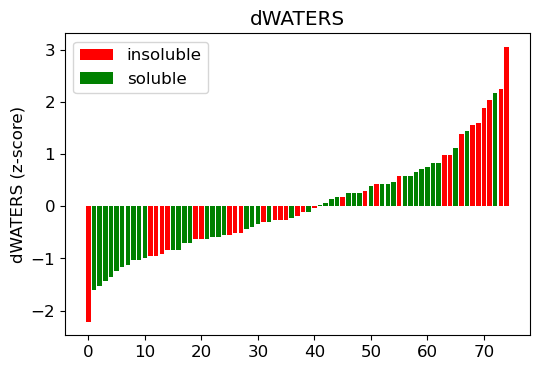

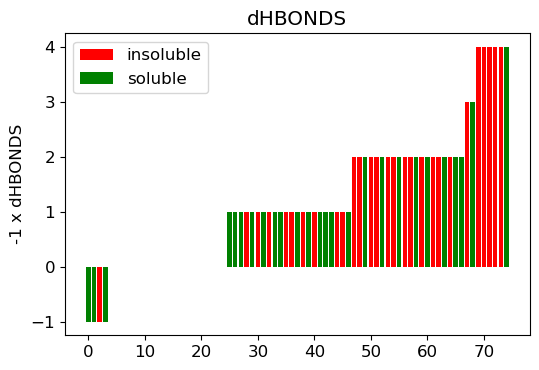

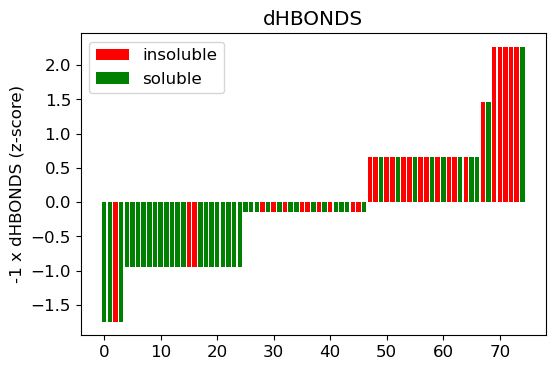

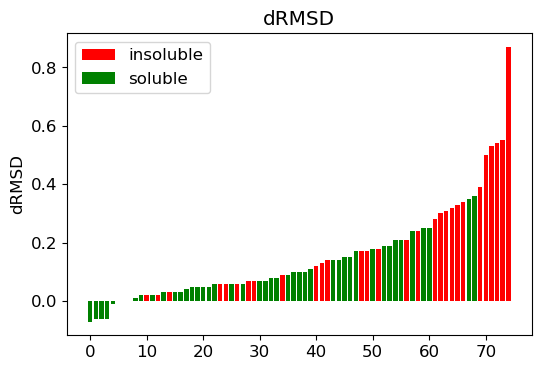

...

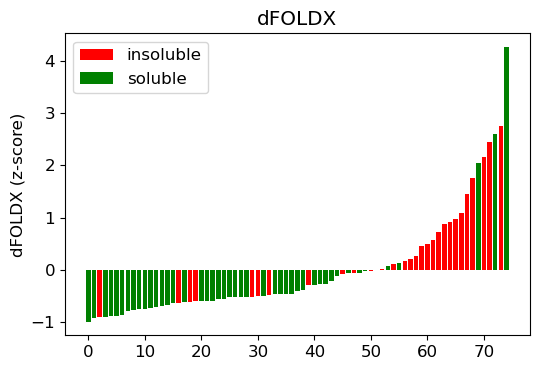

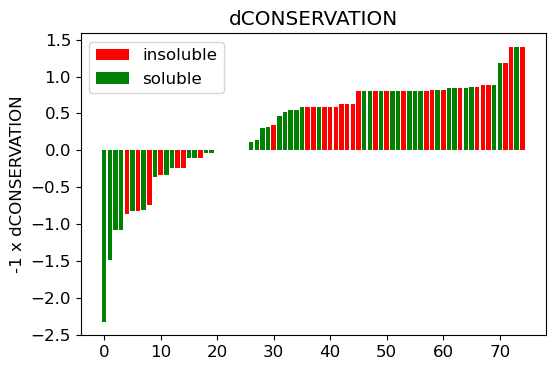

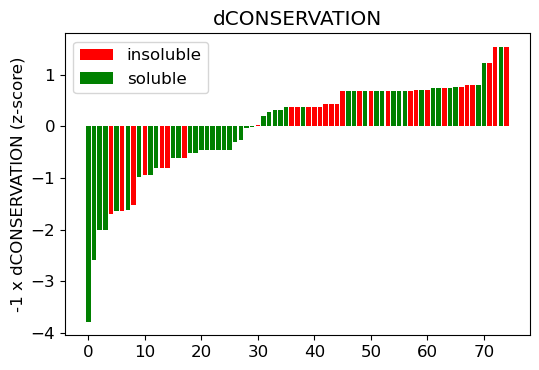

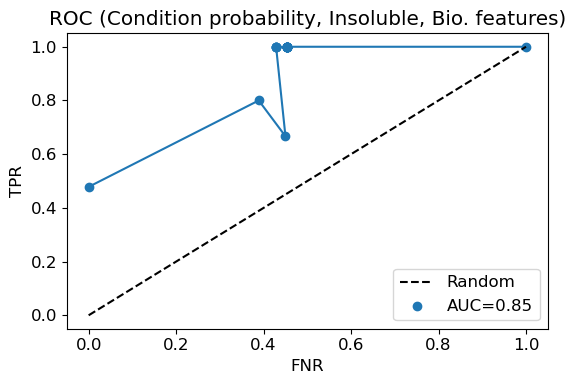

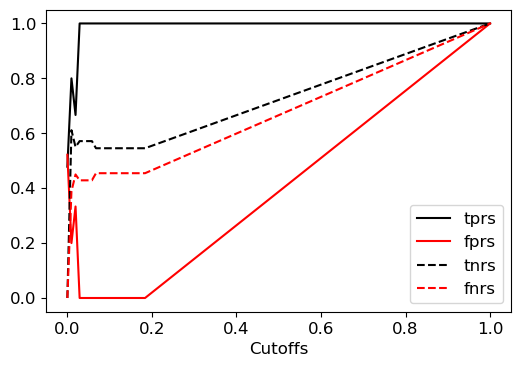

In [56]:
# All features
outputs = dU.ProbClassifier(df,tagsAll2,display=display,split=True,bootstrap=True)

/home/xfang/repos/herg/probUtil.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:159: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/anaconda3/lib/pyth

TESTING  stats
Accuracy(NT) 0.782608695652174
Precision(NT) 1.0
Recall(NT) 0.4444444444444444
F1 score(NT) 0.6153846153846154
Accuracy(T) 0.782608695652174
Precision(T) 0.7368421052631579
Recall(T) 1.0
F1 score(T) 0.8484848484848485


/home/xfang/repos/herg/probUtil.py:236: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:236: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probUtil.py:389: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
/home/xfang/repos/herg/probU

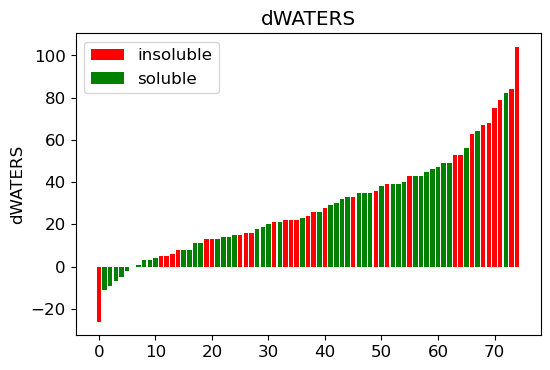

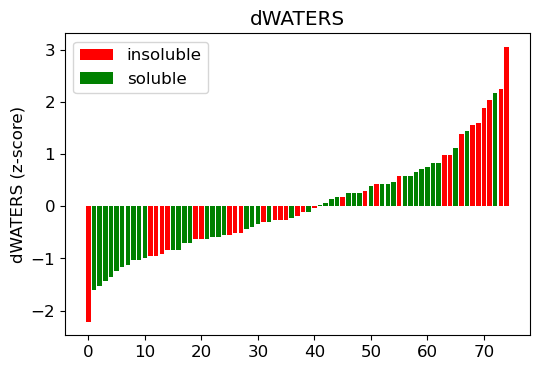

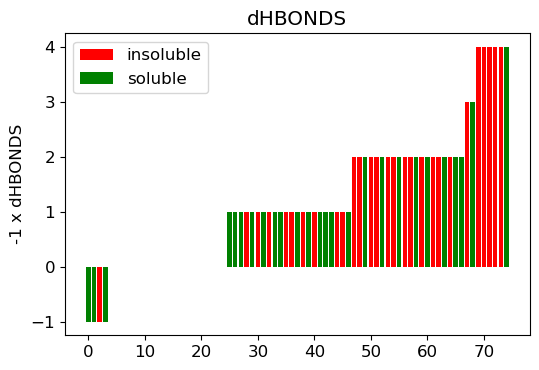

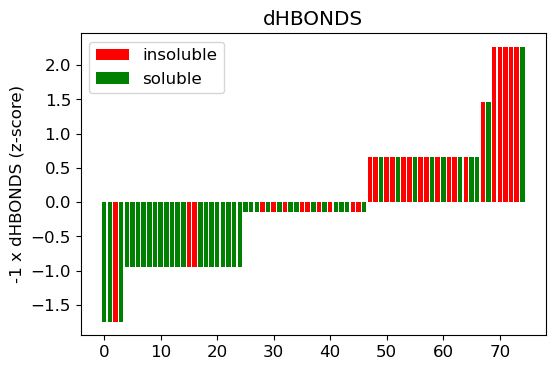

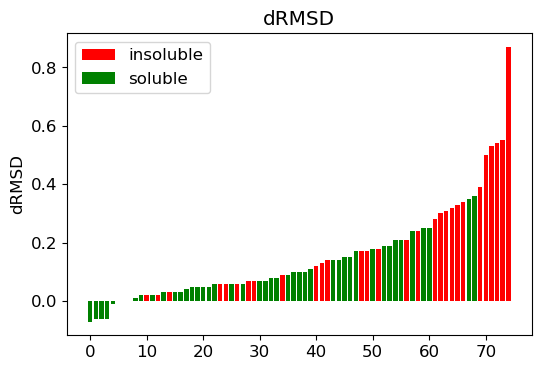

...

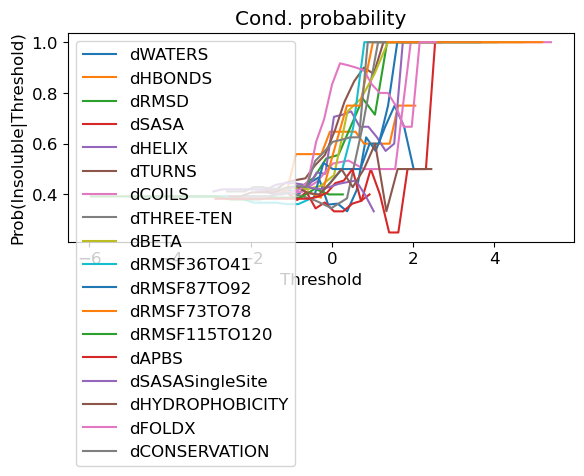

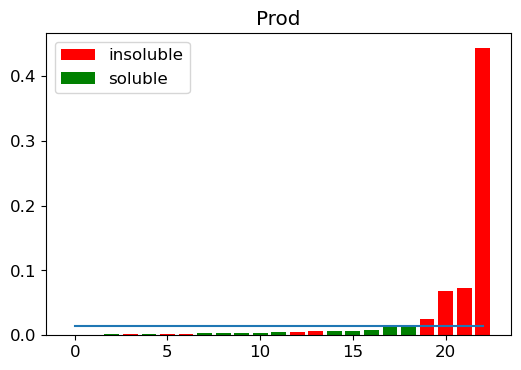

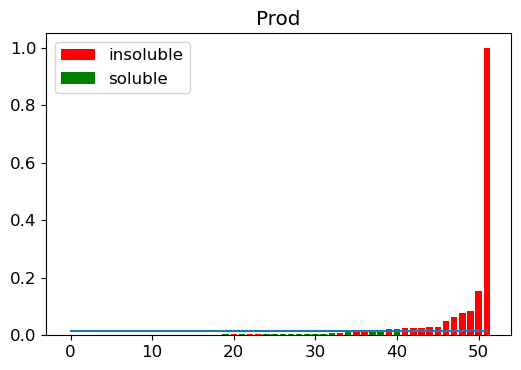

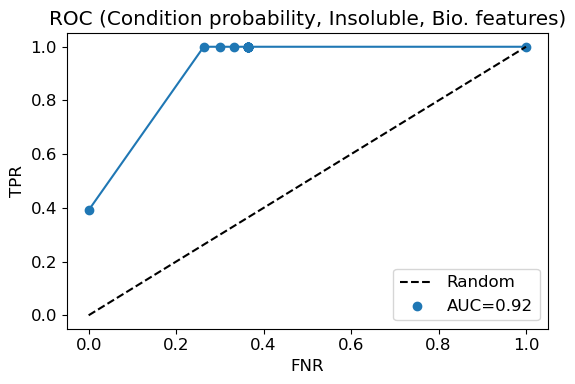

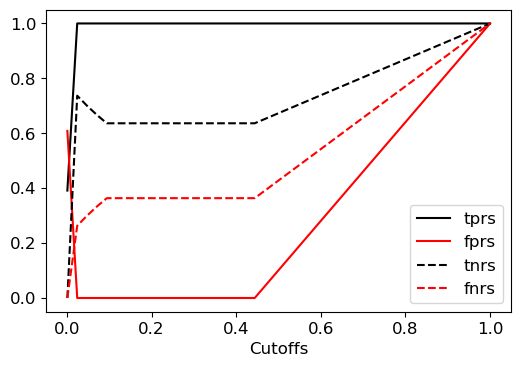

In [57]:
# All features
# representative ROC and prod
outputs = dU.ProbClassifier(df,tagsAll2,display=display,split=True,bootstrap=False)

### Section 2: Build and Apply machine-learning classifiers 
<a id=’section_2’></a>

Outputs
- Metrics for classification performance (precision, recall etc). Terms are defined in Methods of hERG paper
- Cross-validation matrix
- ROC curve
- Most important features used in classifier


In [58]:
# done on Kal's local machine and the end result "rmsf_sub*.txt" is under /feature_sets
regenRMSF=False

if regenRMSF:
    #read a rmsf file to a pandas data frame
    rmsfile = "feature_sets/rmsf-matrix.txt"
    dfrmsf = pd.read_csv(rmsfile, sep="\s+", comment='#')
    dfrmsf.head()

    #extract a subset of rows from rmsf file
    dfrmsf_sub = dfrmsf.loc[89:94,] # actual residues in the sequence 115 to 120 
    dfrmsf_sub2 = dfrmsf.loc[10:15,]# actual residues in the sequence 36 to 41
    dfrmsf_sub3 = dfrmsf.loc[61:66,]# actual residues in the sequence 87 to 92
    dfrmsf_sub4 = dfrmsf.loc[47:52,]# actual residues in the sequence 73 to 78

    #calculate the mean of the rows 89 to 94 for each variant
    dfrmsf_sub_mean = dfrmsf_sub.mean().round(2)
    dfrmsf_sub2_mean = dfrmsf_sub2.mean().round(2)
    dfrmsf_sub3_mean = dfrmsf_sub3.mean().round(2)
    dfrmsf_sub4_mean = dfrmsf_sub4.mean().round(2)

    #dfrmsf_sub_mean
    dfrmsf_sub_mean.shape

    #save the mean of rows 89 to 94 to a file
    dfrmsf_sub_mean.to_csv('feature_sets/rmsf_sub.txt', sep='\t', header=["RMSF115TO120"])
    dfrmsf_sub2_mean.to_csv('feature_sets/rmsf_sub2.txt', sep='\t', header=["RMSF36TO41"])
    dfrmsf_sub3_mean.to_csv('feature_sets/rmsf_sub3.txt', sep='\t', header=["RMSF87TO92"])
    dfrmsf_sub4_mean.to_csv('feature_sets/rmsf_sub4.txt', sep='\t', header=["RMSF73TO78"])

    dfrmsf_sub_mean.columns=['RMSF115TO120']

In [59]:
if 0:
    df['HELIX'] = df['HELIX'].round(2)
    df['TURNS'] = df['TURNS'].round(2)
    df['COILS'] = df['COILS'].round(2)
    df['THREE-TEN'] = df['THREE-TEN'].round(2)
    df['BETA'] = df['BETA'].round(2)
    df['RMSD'] = df['RMSD'].round(2)
    df['HBONDS'] = df['HBONDS'].round()
    df['SASA'] = df['SASA'].round()
    df['WATERS'] = df['WATERS'].round()
    df['FOLDX'] = df['FOLDX'].round(2)
    df['CONSERVATION'] = df['CONSERVATION'].round(2)
    df['HYDROPHOBICITY'] = df['HYDROPHOBICITY'].round(2)
    
    df.head()

In [8]:
features=["HELIX","TURNS","COILS","THREE-TEN","BETA","RMSD","HBONDS","SASA","WATERS","FOLDX","CONSERVATION","HYDROPHOBICITY"]
output = ["TRAFFICKING"]

### some parameters

In [23]:
display=True
random_state=50

In [24]:
mlData={}

## Decision tree


Example with PAS data

In [25]:
mlData['DT']={}

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       0.88      0.58      0.70        12
    trafficking       0.67      0.91      0.77        11

       accuracy                           0.74        23
      macro avg       0.77      0.75      0.73        23
   weighted avg       0.78      0.74      0.73        23



<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

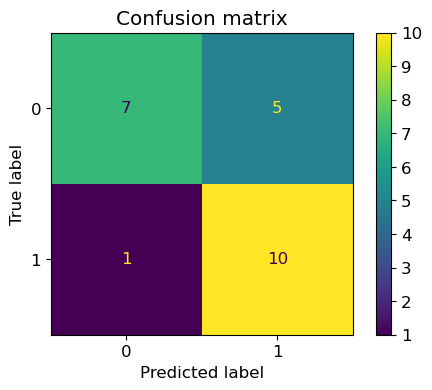

<Figure size 600x400 with 0 Axes>

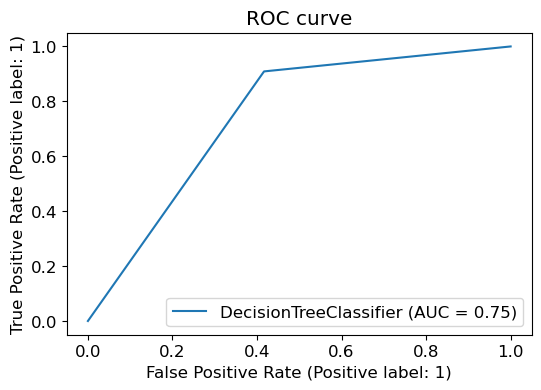

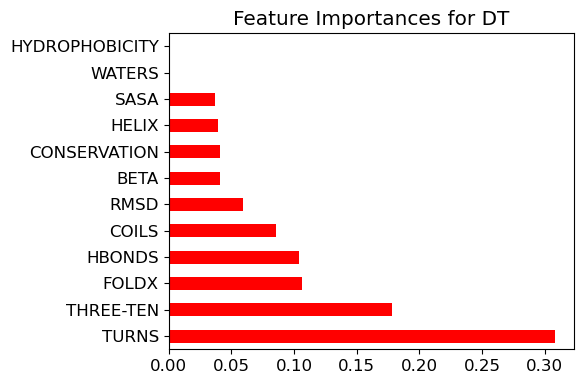

In [64]:
outputs = mlUtil.MLClassifier(df,features,output,classifier="DT", display=display, random_state=random_state) 
cases['DT'] = outputs

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.34782608695652173
                 precision    recall  f1-score   support

non-trafficking       0.33      0.25      0.29        12
    trafficking       0.36      0.45      0.40        11

       accuracy                           0.35        23
      macro avg       0.35      0.35      0.34        23
   weighted avg       0.34      0.35      0.34        23



<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

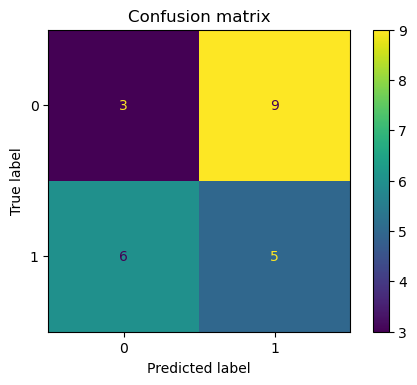

<Figure size 600x400 with 0 Axes>

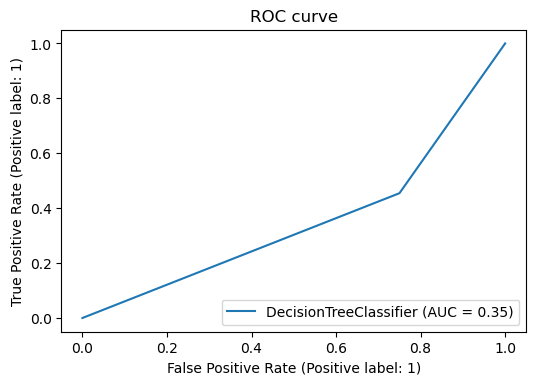

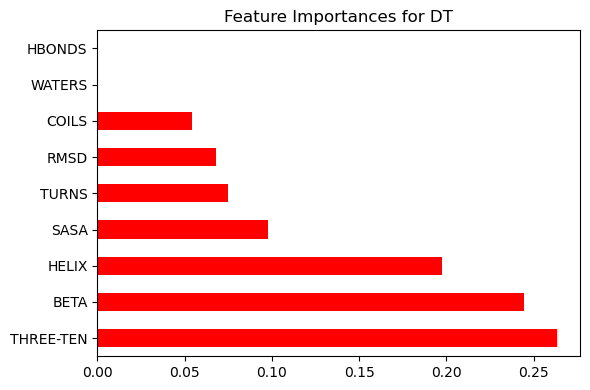

In [26]:
# MD 
outputs = mlUtil.MLClassifier(df,tagsMD1,output,classifier="DT", display=display, random_state=random_state) 

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.67      0.33      0.44        12
    trafficking       0.53      0.82      0.64        11

       accuracy                           0.57        23
      macro avg       0.60      0.58      0.54        23
   weighted avg       0.60      0.57      0.54        23



<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

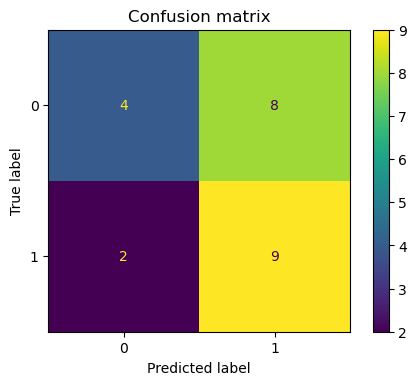

<Figure size 600x400 with 0 Axes>

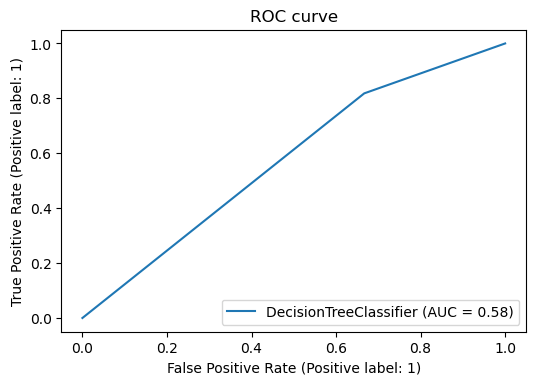

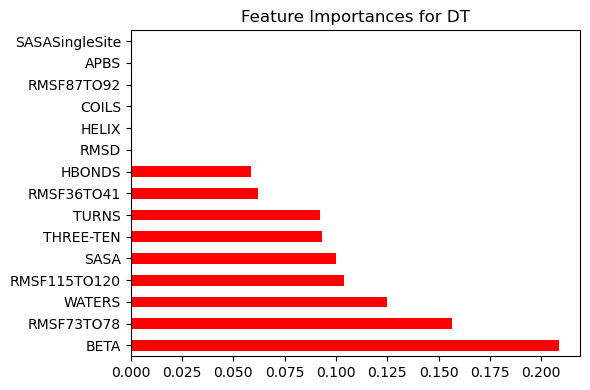

In [28]:
# MD 
outputs = mlUtil.MLClassifier(df,tagsMD2,output,classifier="DT", display=display, random_state=random_state) 
mlData['DT']['MD']=outputs

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.67      0.33      0.44        12
    trafficking       0.53      0.82      0.64        11

       accuracy                           0.57        23
      macro avg       0.60      0.58      0.54        23
   weighted avg       0.60      0.57      0.54        23



<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

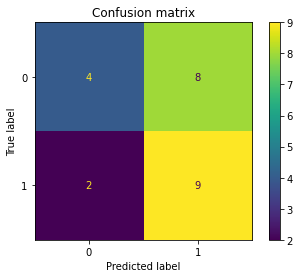

<Figure size 432x288 with 0 Axes>

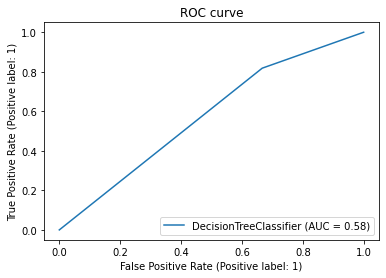

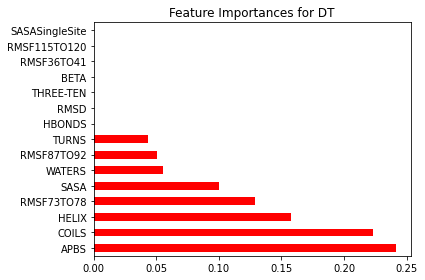

In [76]:
# MD 
# max_feature=3
outputs = mlUtil.MLClassifier(df,tagsMD2,output,classifier="DT", display=display, random_state=random_state) 
mlData['DT']['MD']=outputs

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23



<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

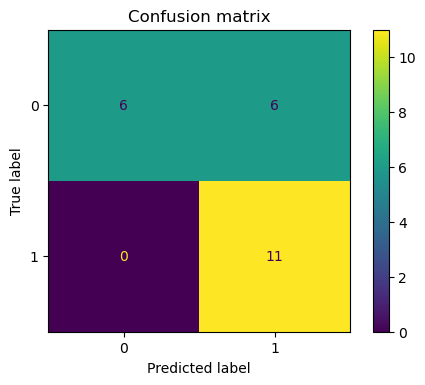

<Figure size 600x400 with 0 Axes>

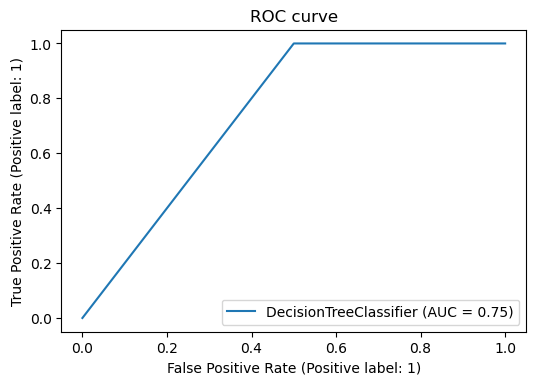

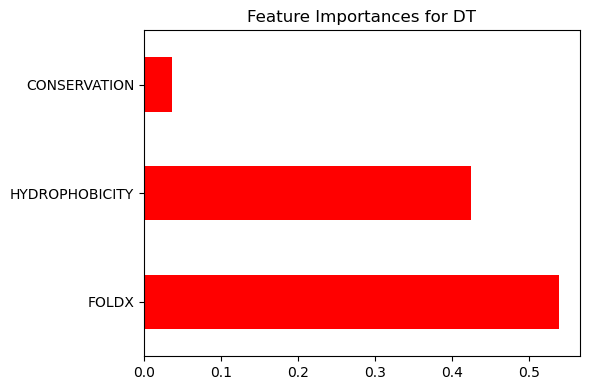

In [29]:
# Bio
outputs = mlUtil.MLClassifier(df,tagsBio,output,classifier="DT", display=display, random_state=random_state) 
mlData['DT']['Bio']=outputs

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.67      0.33      0.44        12
    trafficking       0.53      0.82      0.64        11

       accuracy                           0.57        23
      macro avg       0.60      0.58      0.54        23
   weighted avg       0.60      0.57      0.54        23



<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

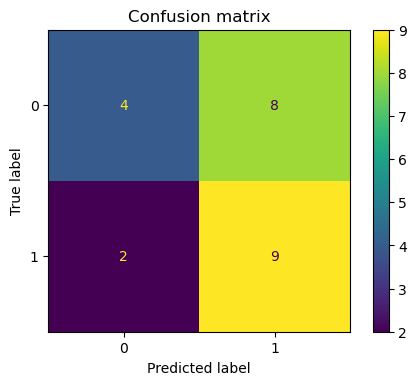

<Figure size 600x400 with 0 Axes>

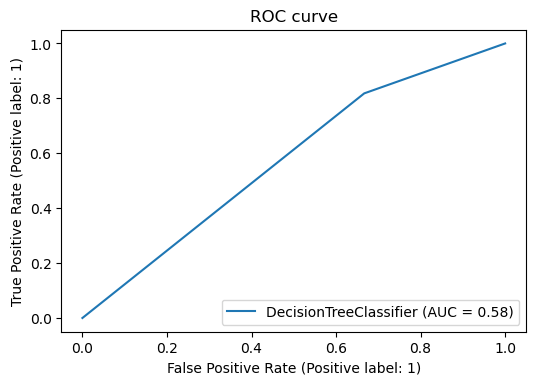

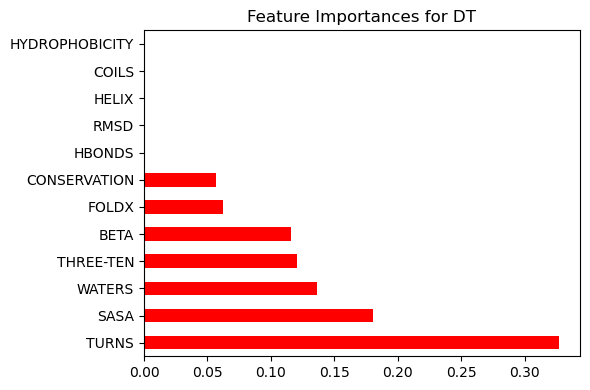

In [15]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll1,output,classifier="DT", display=display, random_state=random_state) 

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.62      0.42      0.50        12
    trafficking       0.53      0.73      0.62        11

       accuracy                           0.57        23
      macro avg       0.58      0.57      0.56        23
   weighted avg       0.58      0.57      0.56        23



<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

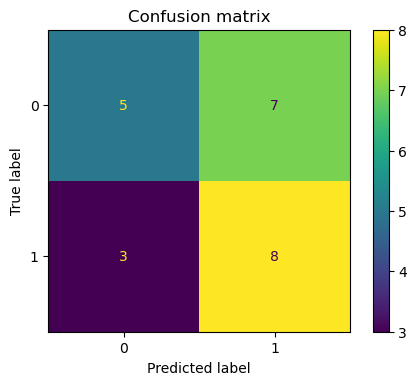

<Figure size 600x400 with 0 Axes>

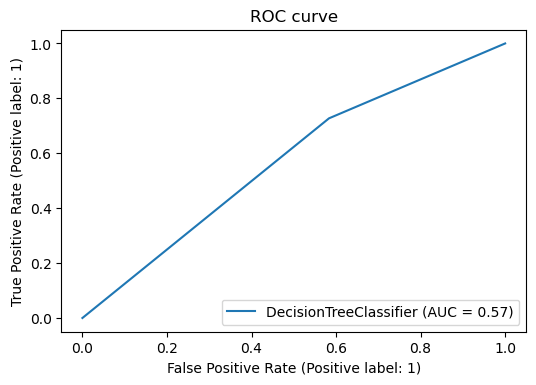

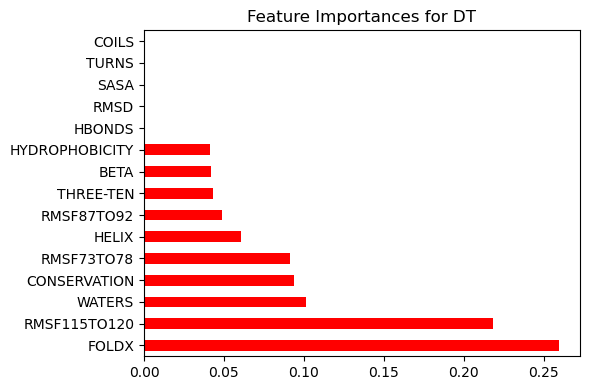

In [30]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll2,output,classifier="DT", display=display, random_state=random_state) 
mlData['DT']['All']=outputs

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       0.78      0.58      0.67        12
    trafficking       0.64      0.82      0.72        11

       accuracy                           0.70        23
      macro avg       0.71      0.70      0.69        23
   weighted avg       0.71      0.70      0.69        23



<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

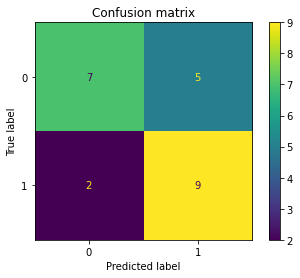

<Figure size 432x288 with 0 Axes>

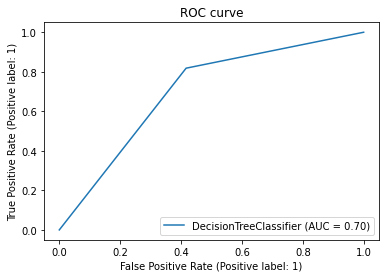

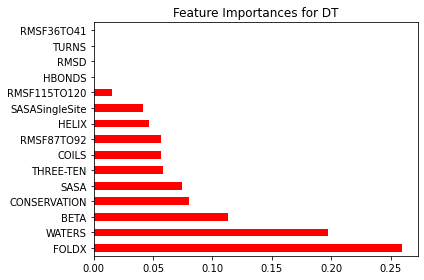

In [75]:
# All
# max_feature=3
outputs = mlUtil.MLClassifier(df,tagsAll2,output,classifier="DT", display=display, random_state=random_state) 
mlData['DT']['All']=outputs

#### plot ROC curves

MD
Bio
All


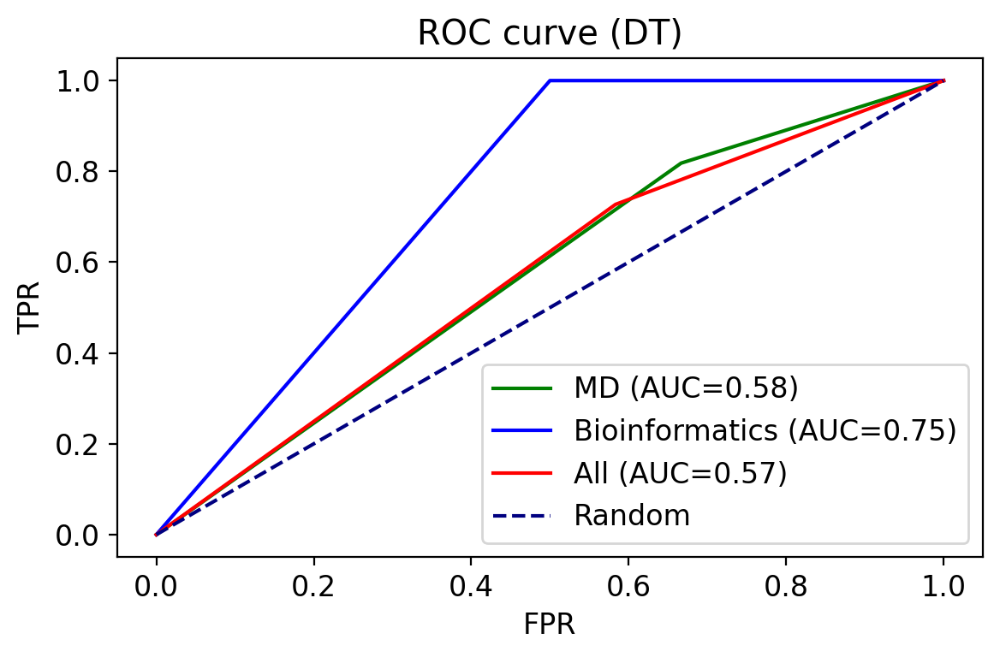

In [17]:
# compare different feature sets
labels=['MD','Bioinformatics','All']
cols=['green','blue','red']

#rcParams['figure.figsize']=7,4
rcParams['font.size']=12
rcParams['figure.dpi']=200
plt.figure()
plt.title('ROC curve (DT)')
for i,key in enumerate(mlData['DT'].keys()):
    print(key)
    fpr,tpr,auc=mlData['DT'][key]['fprs'], mlData['DT'][key]['tprs'], mlData['DT'][key]['auc']
    plt.plot(fpr,tpr,label="{} (AUC=%0.2f)".format(labels[i])% auc,color=cols[i])

plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend(loc=4)
plt.tight_layout()
plt.savefig('roc_DT.png')
rcParams['figure.dpi']=100

Decision tree classifier
Training sample accuracy
Overall accuracy  0.9423076923076923
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.56      0.75      0.64        12
    trafficking       0.57      0.36      0.44        11

       accuracy                           0.57        23
      macro avg       0.57      0.56      0.54        23
   weighted avg       0.57      0.57      0.55        23

Decision tree classifier
Training sample accuracy
Overall accuracy  0.7115384615384616
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       0.73      0.67      0.70        12
    trafficking       0.67      0.73      0.70        11

       accuracy                           0.70        23
      macro avg       0.70      0.70      0.70        23
   weighted avg       0.70      0.70      0.70        23

Decision tree classifier
Training 

                 precision    recall  f1-score   support

non-trafficking       0.56      0.42      0.48        12
    trafficking       0.50      0.64      0.56        11

       accuracy                           0.52        23
      macro avg       0.53      0.53      0.52        23
   weighted avg       0.53      0.52      0.52        23

Decision tree classifier
Training sample accuracy
Overall accuracy  0.9423076923076923
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.50      0.25      0.33        12
    trafficking       0.47      0.73      0.57        11

       accuracy                           0.48        23
      macro avg       0.49      0.49      0.45        23
   weighted avg       0.49      0.48      0.45        23

Decision tree classifier
Training sample accuracy
Overall accuracy  0.9807692307692307
Test Accuracy
Overall accuracy  0.43478260869565216
                 precision    rec

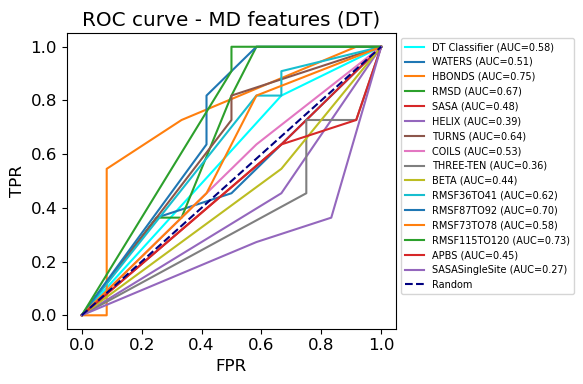

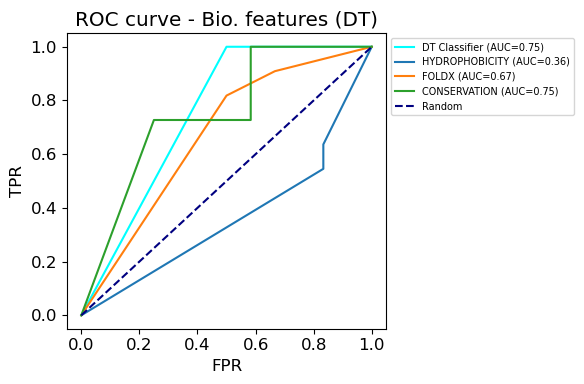

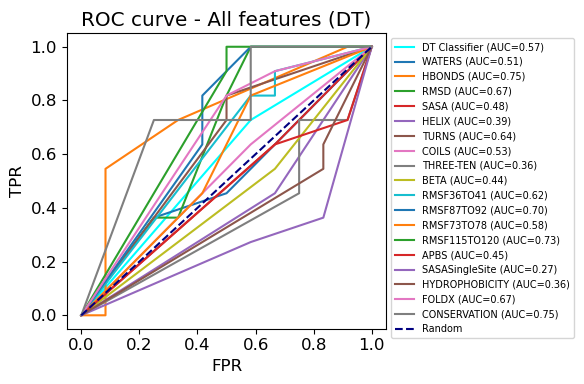

In [41]:
# plot individual features for different feature sets
featSets=[tagsMD2,tagsBio,tagsAll2]
keys=['MD','Bio','All']
labels=['MD', 'Bio.', 'All']
clf='DT'
rcParams['figure.dpi']=100

for i,key in enumerate(keys):
    feats=featSets[i]    
    plt.figure()
    ax=plt.subplot()
    ax.set_xlabel('FPR')
    ax.set_ylabel('TPR')
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_title('ROC curve - {} features ({})'.format(labels[i], clf))

    # plot classifier ROC
    tpr, fpr, auc = mlData[clf][key]['tprs'], mlData[clf][key]['fprs'], mlData[clf][key]['auc']
    plt.plot (fpr, tpr, color='cyan', label="{} Classifier (AUC=%0.2f)".format(clf)% auc)

    # plot feature ROC
    for feat in feats:
        outputs = mlUtil.MLClassifier(df,[feature],output,classifier=clf, display=False, random_state=random_state)
        tpr, fpr, auc = outputs['tprs'], outputs['fprs'], outputs['auc']
        plt.plot(fpr,tpr,label="{} (AUC=%0.2f)".format(feat)% auc)

    # plot random line
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
    plt.legend(bbox_to_anchor=(1,1), loc='upper left',fontsize=7)
    plt.tight_layout()
    plt.savefig('{}_indiFeature_{}.png'.format(clf,key))

rcParams['figure.dpi']=100

## Random forest classifier 

In [31]:
mlData['RF']={}

k-fold crossvalidation results
[1.         0.5        0.75       0.75       0.625      0.85714286
 0.71428571 0.57142857 0.71428571 0.71428571] 

results mean
0.7196428571428571 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       0.88      0.58      0.70        12
    trafficking       0.67      0.91      0.77        11

       accuracy                           0.74        23
      macro avg       0.77      0.75      0.73        23
   weighted avg       0.78      0.74      0.73        23



<Figure size 600x400 with 0 Axes>

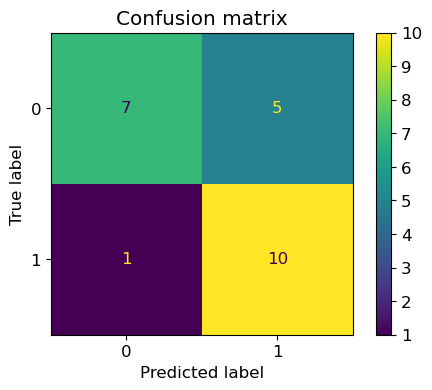

<Figure size 600x400 with 0 Axes>

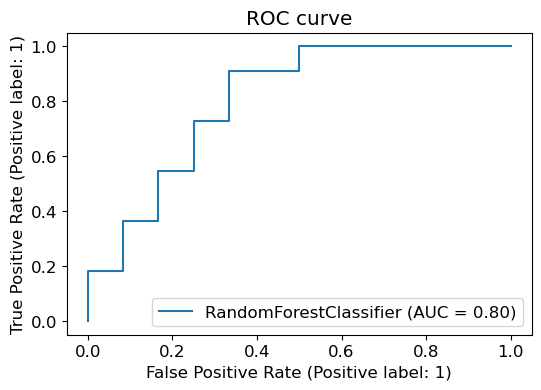

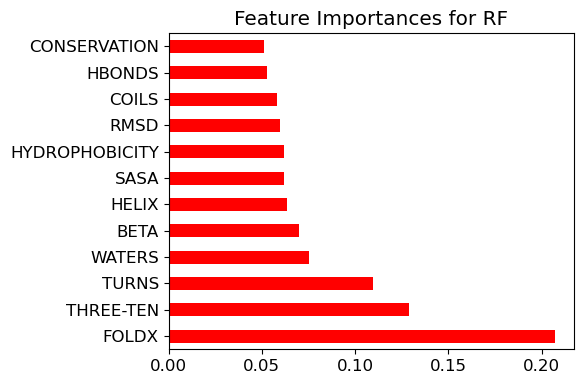

In [75]:
outputs = mlUtil.MLClassifier(df,features,output,classifier="RF",display=display) 
cases['RF'] = outputs


k-fold crossvalidation results
[0.625      0.75       0.75       0.625      0.625      1.
 0.42857143 0.57142857 0.57142857 0.71428571] 

results mean
0.6660714285714285 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6521739130434783
                 precision    recall  f1-score   support

non-trafficking       0.83      0.42      0.56        12
    trafficking       0.59      0.91      0.71        11

       accuracy                           0.65        23
      macro avg       0.71      0.66      0.63        23
   weighted avg       0.72      0.65      0.63        23



<Figure size 600x400 with 0 Axes>

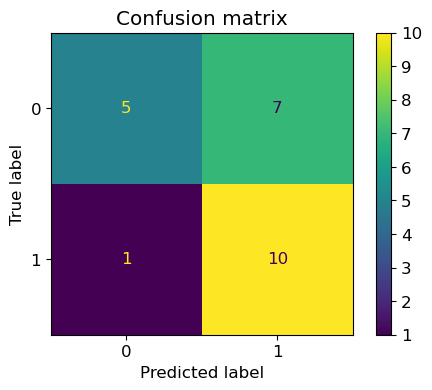

<Figure size 600x400 with 0 Axes>

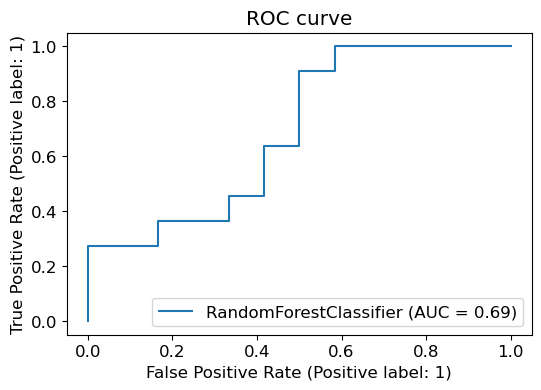

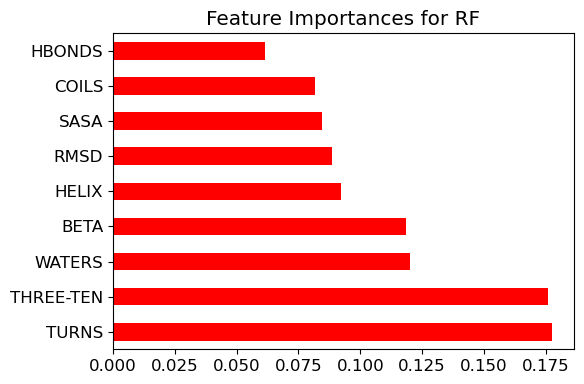

In [76]:
# MD
outputs = mlUtil.MLClassifier(df,tagsMD1,output,classifier="RF",display=display) 

k-fold crossvalidation results
[0.75       0.875      0.75       0.625      0.625      1.
 0.57142857 0.57142857 0.42857143 0.71428571] 

results mean
0.6910714285714286 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



<Figure size 600x400 with 0 Axes>

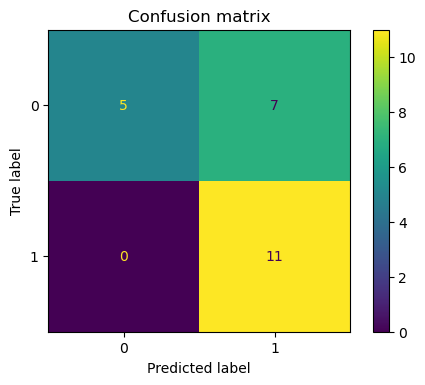

<Figure size 600x400 with 0 Axes>

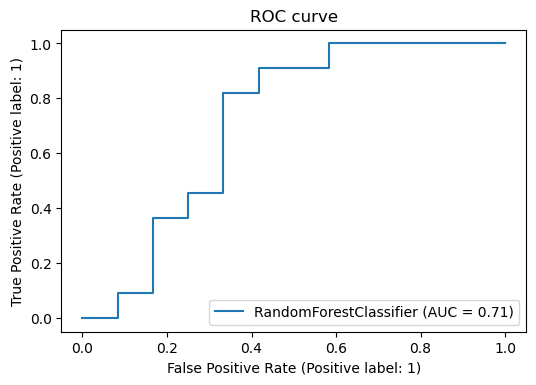

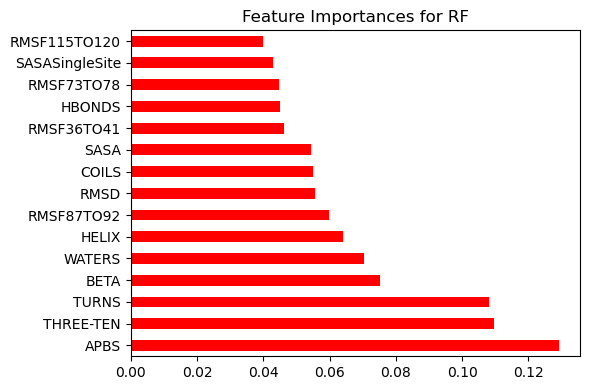

In [32]:
# MD
outputs = mlUtil.MLClassifier(df,tagsMD2,output,classifier="RF",display=display) 
mlData['RF']['MD']=outputs

k-fold crossvalidation results
[0.75       0.875      0.75       0.625      0.625      1.
 0.57142857 0.57142857 0.42857143 0.71428571] 

results mean
0.6910714285714286 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



<Figure size 432x288 with 0 Axes>

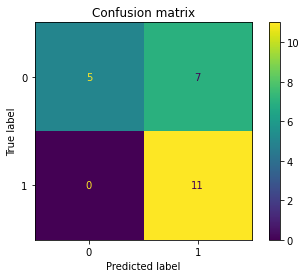

<Figure size 432x288 with 0 Axes>

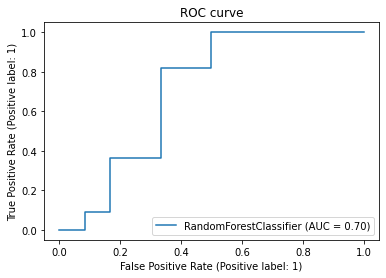

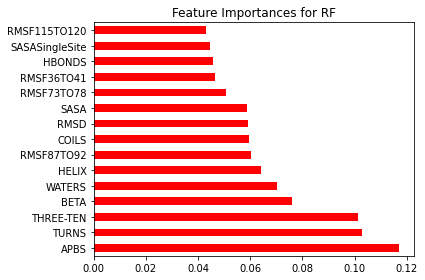

In [74]:
# MD
# max_feature=3
outputs = mlUtil.MLClassifier(df,tagsMD2,output,classifier="RF",display=display) 
mlData['RF']['MD']=outputs

k-fold crossvalidation results
[0.75       0.5        0.875      1.         0.75       0.71428571
 0.71428571 0.85714286 0.71428571 0.42857143] 

results mean
0.7303571428571429 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23



<Figure size 600x400 with 0 Axes>

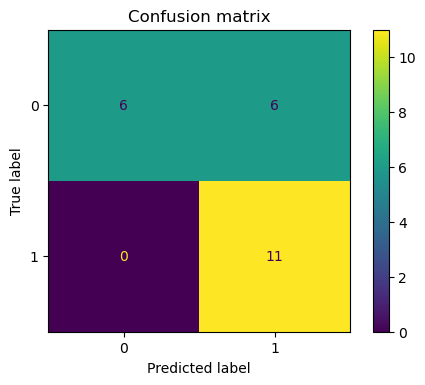

<Figure size 600x400 with 0 Axes>

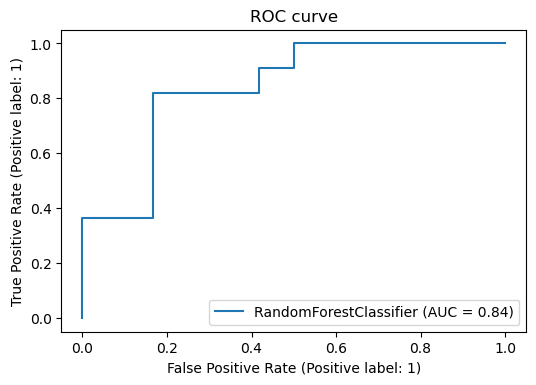

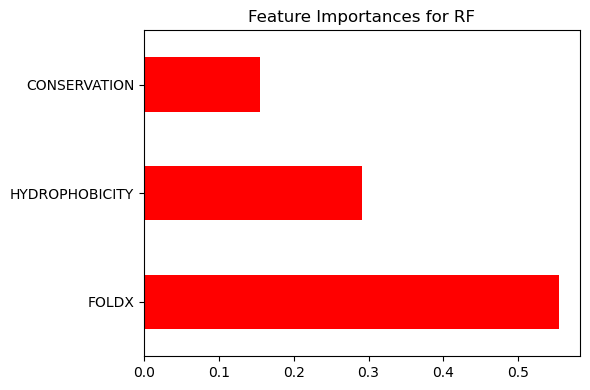

In [33]:
# Bio
outputs = mlUtil.MLClassifier(df,tagsBio,output,classifier="RF",display=display) 
mlData['RF']['Bio']=outputs

k-fold crossvalidation results
[1.         0.5        0.75       0.75       0.625      0.85714286
 0.71428571 0.57142857 0.71428571 0.71428571] 

results mean
0.7196428571428571 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       0.88      0.58      0.70        12
    trafficking       0.67      0.91      0.77        11

       accuracy                           0.74        23
      macro avg       0.77      0.75      0.73        23
   weighted avg       0.78      0.74      0.73        23



<Figure size 600x400 with 0 Axes>

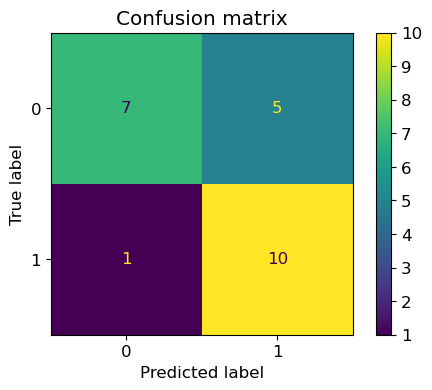

<Figure size 600x400 with 0 Axes>

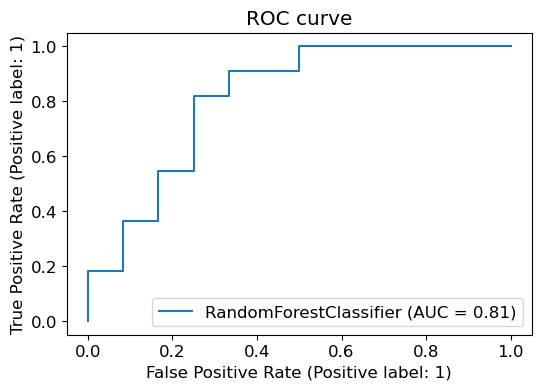

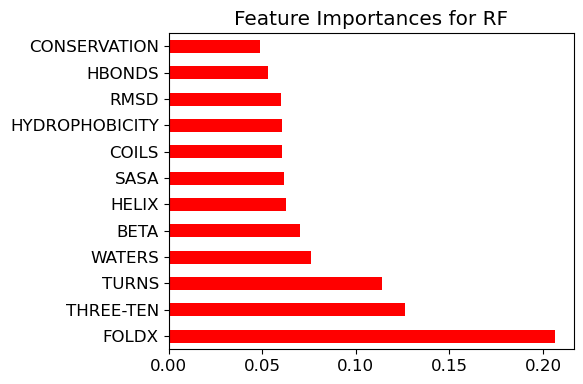

In [79]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll1,output,classifier="RF",display=display) 

k-fold crossvalidation results
[1.         0.625      0.75       0.625      0.625      1.
 0.57142857 0.57142857 0.71428571 0.71428571] 

results mean
0.7196428571428571 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23



<Figure size 600x400 with 0 Axes>

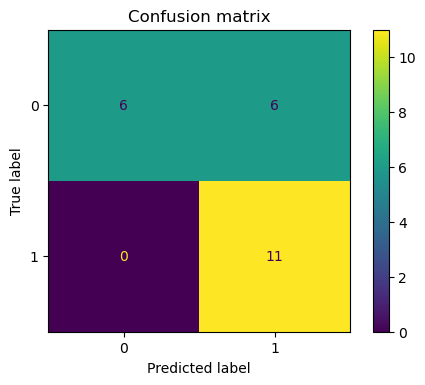

<Figure size 600x400 with 0 Axes>

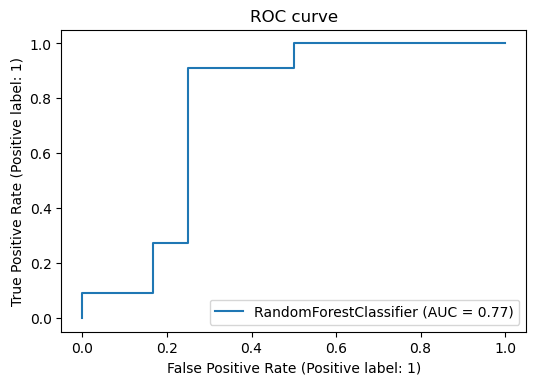

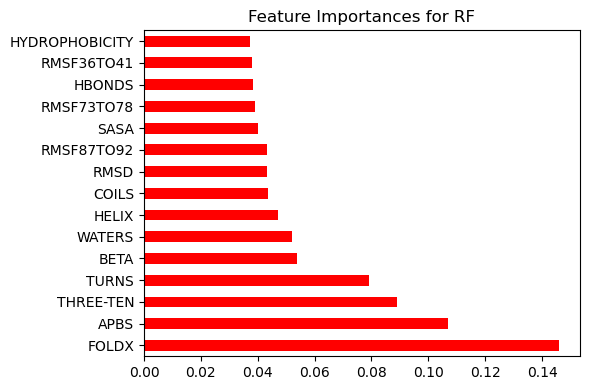

In [34]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll2,output,classifier="RF",display=display) 
mlData['RF']['All']=outputs

k-fold crossvalidation results
[1.         0.625      0.75       0.625      0.625      1.
 0.57142857 0.57142857 0.71428571 0.71428571] 

results mean
0.7196428571428571 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23



<Figure size 432x288 with 0 Axes>

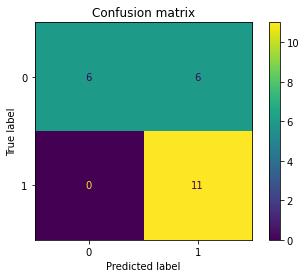

<Figure size 432x288 with 0 Axes>

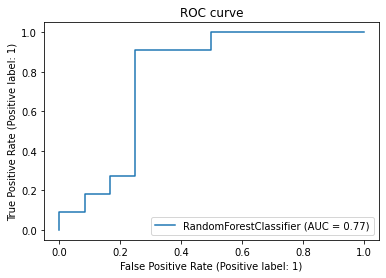

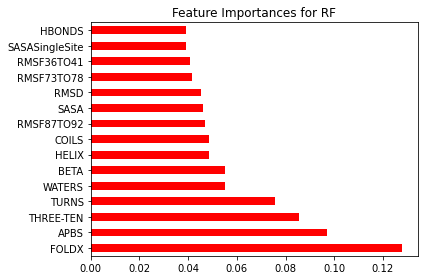

In [73]:
# All
# max_feature=3
outputs = mlUtil.MLClassifier(df,tagsAll2,output,classifier="RF",display=display) 
mlData['RF']['All']=outputs

#### plot ROC curves

MD
Bio
All


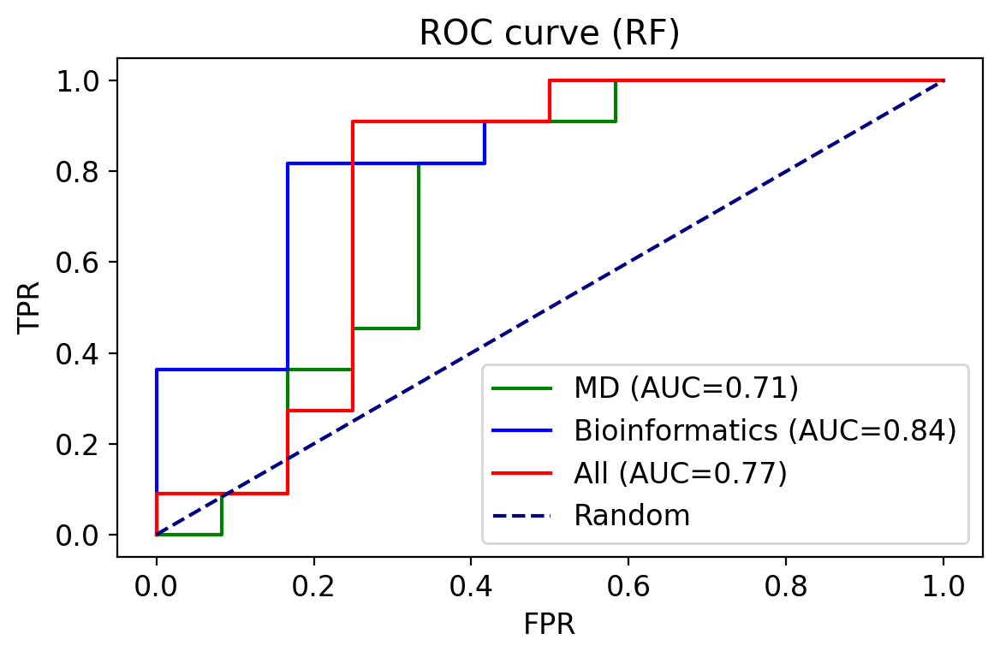

In [172]:
# compare different feature sets
labels=['MD','Bioinformatics','All']
cols=['green','blue','red']

#rcParams['figure.figsize']=7,4
rcParams['font.size']=12
rcParams['figure.dpi']=200
plt.figure()
plt.title('ROC curve (RF)')
for i,key in enumerate(mlData['RF'].keys()):
    print(key)
    fpr,tpr,auc=mlData['RF'][key]['fprs'], mlData['RF'][key]['tprs'], mlData['RF'][key]['auc']
    plt.plot(fpr,tpr,label="{} (AUC=%0.2f)".format(labels[i])% auc,color=cols[i])

plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend(loc=4)
plt.tight_layout()
plt.savefig('roc_RF.png')
rcParams['figure.dpi']=100

k-fold crossvalidation results
[0.5        0.625      0.875      0.75       0.375      0.57142857
 0.85714286 0.42857143 0.42857143 0.71428571] 

results mean
0.6125 

Training sample accuracy
Overall accuracy  0.9423076923076923
Test Accuracy
Overall accuracy  0.6086956521739131
                 precision    recall  f1-score   support

non-trafficking       0.60      0.75      0.67        12
    trafficking       0.62      0.45      0.53        11

       accuracy                           0.61        23
      macro avg       0.61      0.60      0.60        23
   weighted avg       0.61      0.61      0.60        23

k-fold crossvalidation results
[0.875      0.625      0.75       0.625      0.625      1.
 0.71428571 0.85714286 0.14285714 0.71428571] 

results mean
0.6928571428571428 

Training sample accuracy
Overall accuracy  0.7115384615384616
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       0.73     

k-fold crossvalidation results
[0.625      0.375      0.875      0.625      0.625      0.71428571
 0.71428571 0.28571429 0.14285714 0.42857143] 

results mean
0.5410714285714286 

Training sample accuracy
Overall accuracy  0.9807692307692307
Test Accuracy
Overall accuracy  0.391304347826087
                 precision    recall  f1-score   support

non-trafficking       0.25      0.08      0.12        12
    trafficking       0.42      0.73      0.53        11

       accuracy                           0.39        23
      macro avg       0.34      0.41      0.33        23
   weighted avg       0.33      0.39      0.32        23

k-fold crossvalidation results
[0.25       0.125      0.375      0.5        0.375      0.57142857
 0.         0.28571429 0.42857143 0.14285714] 

results mean
0.3053571428571428 

Training sample accuracy
Overall accuracy  0.9807692307692307
Test Accuracy
Overall accuracy  0.2608695652173913
                 precision    recall  f1-score   support

non-traffick

k-fold crossvalidation results
[0.625      0.5        0.75       0.625      0.375      0.57142857
 0.42857143 0.57142857 0.28571429 0.71428571] 

results mean
0.5446428571428571 

Training sample accuracy
Overall accuracy  0.9807692307692307
Test Accuracy
Overall accuracy  0.43478260869565216
                 precision    recall  f1-score   support

non-trafficking       0.44      0.33      0.38        12
    trafficking       0.43      0.55      0.48        11

       accuracy                           0.43        23
      macro avg       0.44      0.44      0.43        23
   weighted avg       0.44      0.43      0.43        23

k-fold crossvalidation results
[0.5        0.375      0.375      0.625      0.625      0.28571429
 0.28571429 0.71428571 0.28571429 0.57142857] 

results mean
0.46428571428571425 

Training sample accuracy
Overall accuracy  0.8269230769230769
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-traff

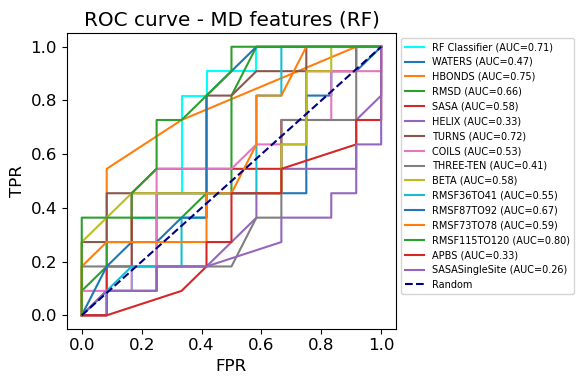

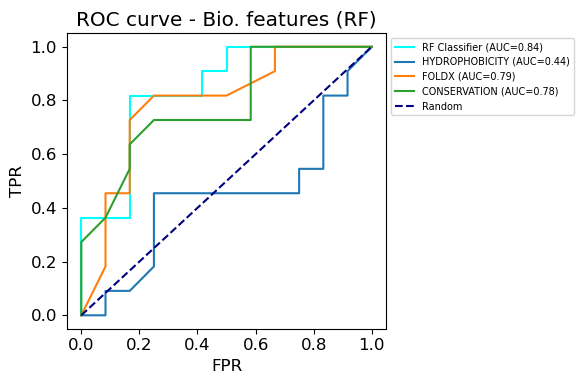

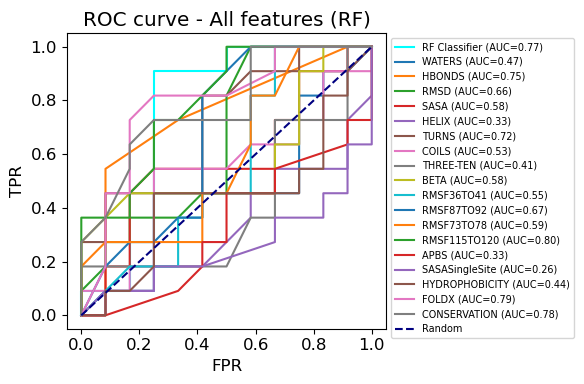

In [60]:
# plot individual features for different feature sets
featSets=[tagsMD2,tagsBio,tagsAll2]
keys=['MD','Bio','All']
labels=['MD', 'Bio.', 'All']
clf='RF'
rcParams['figure.dpi']=100

for i,key in enumerate(keys):
    feats=featSets[i]    
    plt.figure()
    ax=plt.subplot()
    ax.set_xlabel('FPR')
    ax.set_ylabel('TPR')
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_title('ROC curve - {} features ({})'.format(labels[i], clf))

    # plot classifier ROC
    tpr, fpr, auc = mlData[clf][key]['tprs'], mlData[clf][key]['fprs'], mlData[clf][key]['auc']
    plt.plot (fpr, tpr, color='cyan', label="{} Classifier (AUC=%0.2f)".format(clf)% auc)

    # plot feature ROC
    for feat in feats:
        outputs = mlUtil.MLClassifier(df,[feature],output,classifier=clf, display=False, random_state=random_state)
        tpr, fpr, auc = outputs['tprs'], outputs['fprs'], outputs['auc']
        plt.plot(fpr,tpr,label="{} (AUC=%0.2f)".format(feat)% auc)

    # plot random line
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
    plt.legend(bbox_to_anchor=(1,1), loc='upper left',fontsize=7)
    plt.tight_layout()
    plt.savefig('{}_indiFeature_{}.png'.format(clf,key))

rcParams['figure.dpi']=100

## Support vector machines

In [35]:
mlData['SVM']={}

/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)


Training sample accuracy
Overall accuracy  0.7884615384615384
Test Accuracy
Overall accuracy  0.782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.89      0.67      0.76        12
    trafficking       0.71      0.91      0.80        11

       accuracy                           0.78        23
      macro avg       0.80      0.79      0.78        23
   weighted avg       0.81      0.78      0.78        23



<Figure size 600x400 with 0 Axes>

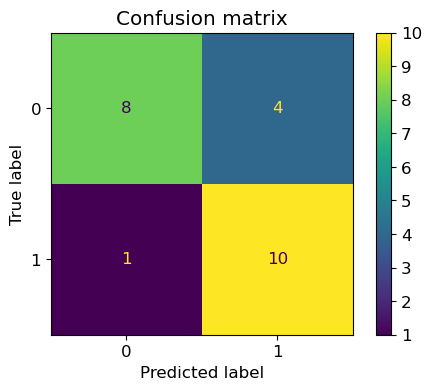

<Figure size 600x400 with 0 Axes>

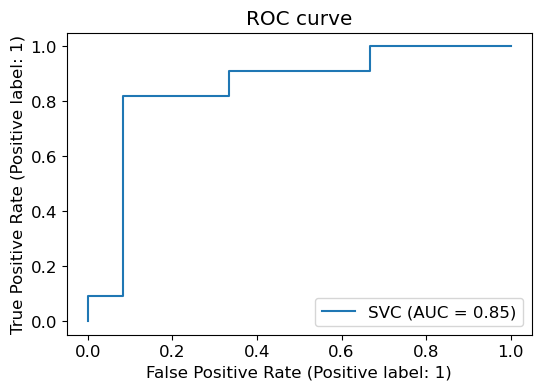

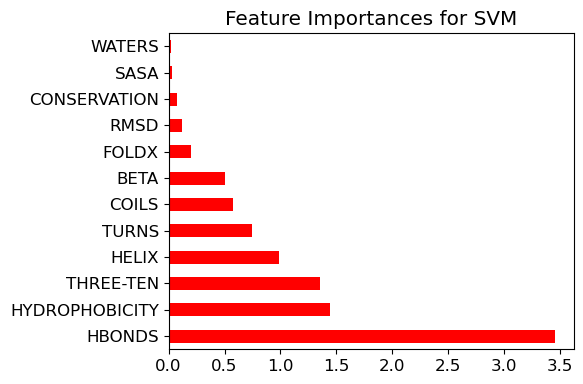

In [83]:
outputs = mlUtil.MLClassifier(df,features,output,classifier="SVM",display=display) 
cases['SVM'] = outputs

/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)


Training sample accuracy
Overall accuracy  0.7884615384615384
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       1.00      0.17      0.29        12
    trafficking       0.52      1.00      0.69        11

       accuracy                           0.57        23
      macro avg       0.76      0.58      0.49        23
   weighted avg       0.77      0.57      0.48        23



<Figure size 600x400 with 0 Axes>

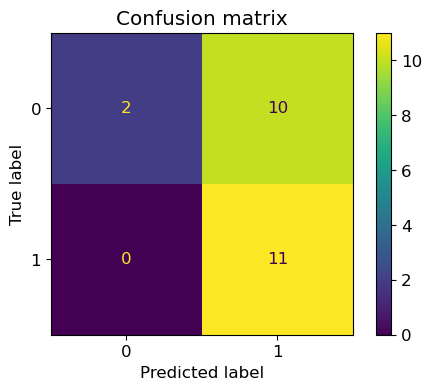

<Figure size 600x400 with 0 Axes>

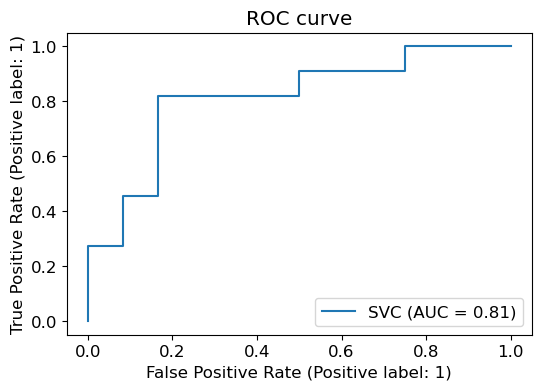

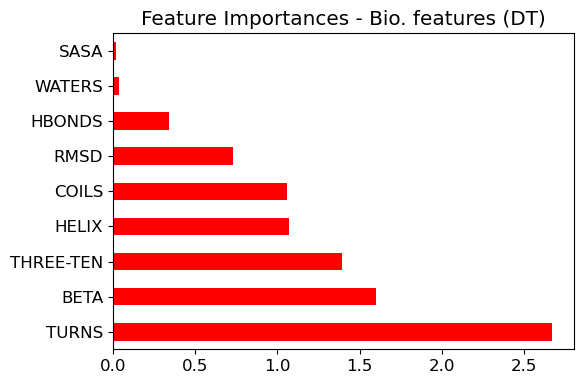

In [43]:
# MD
outputs = mlUtil.MLClassifier(df,tagsMD1,output,classifier="SVM",display=display)

/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)


Training sample accuracy
Overall accuracy  0.6346153846153846
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.50      0.42      0.45        12
    trafficking       0.46      0.55      0.50        11

       accuracy                           0.48        23
      macro avg       0.48      0.48      0.48        23
   weighted avg       0.48      0.48      0.48        23



<Figure size 600x400 with 0 Axes>

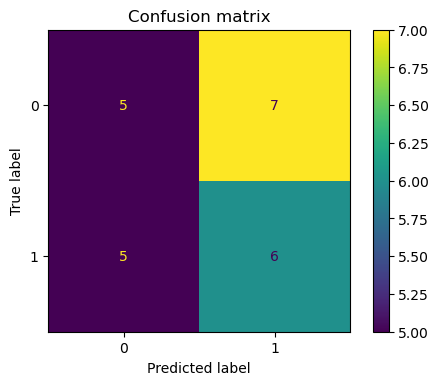

<Figure size 600x400 with 0 Axes>

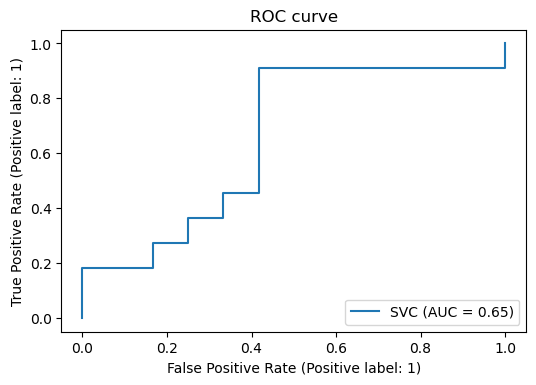

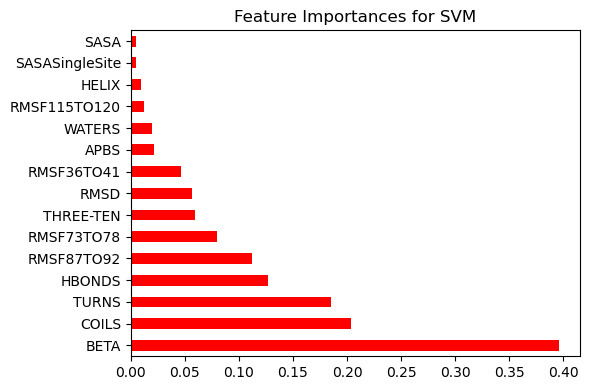

In [36]:
# MD
outputs = mlUtil.MLClassifier(df,tagsMD2,output,classifier="SVM",display=display)
mlData['SVM']['MD']=outputs

Training sample accuracy
Overall accuracy  0.6730769230769231
Test Accuracy
Overall accuracy  0.6521739130434783
                 precision    recall  f1-score   support

non-trafficking       1.00      0.33      0.50        12
    trafficking       0.58      1.00      0.73        11

       accuracy                           0.65        23
      macro avg       0.79      0.67      0.62        23
   weighted avg       0.80      0.65      0.61        23



<Figure size 600x400 with 0 Axes>

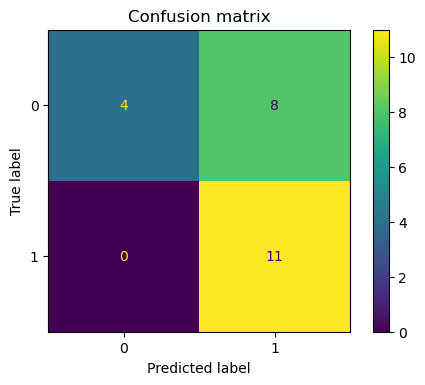

<Figure size 600x400 with 0 Axes>

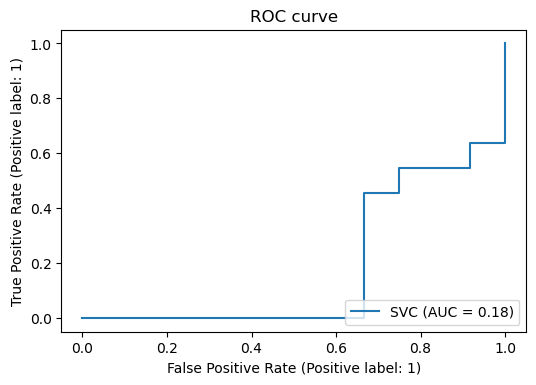

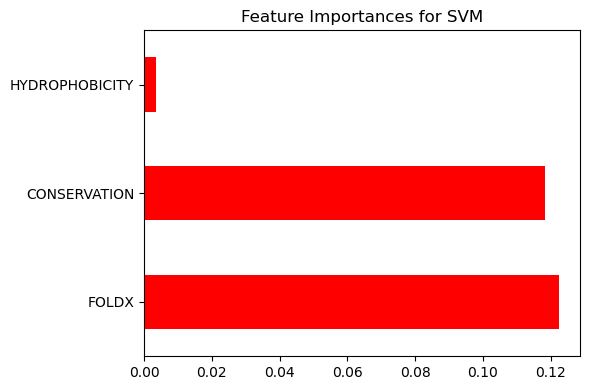

In [37]:
# Bio
outputs = mlUtil.MLClassifier(df,tagsBio,output,classifier="SVM",display=display)
mlData['SVM']['Bio']=outputs

/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)


Training sample accuracy
Overall accuracy  0.7884615384615384
Test Accuracy
Overall accuracy  0.782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.89      0.67      0.76        12
    trafficking       0.71      0.91      0.80        11

       accuracy                           0.78        23
      macro avg       0.80      0.79      0.78        23
   weighted avg       0.81      0.78      0.78        23



<Figure size 600x400 with 0 Axes>

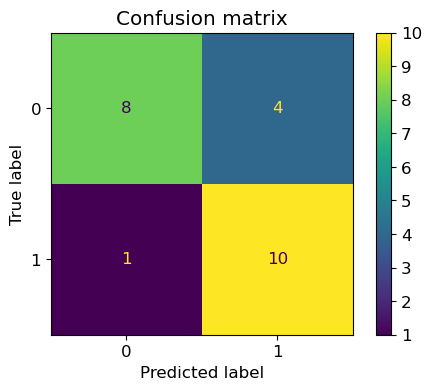

<Figure size 600x400 with 0 Axes>

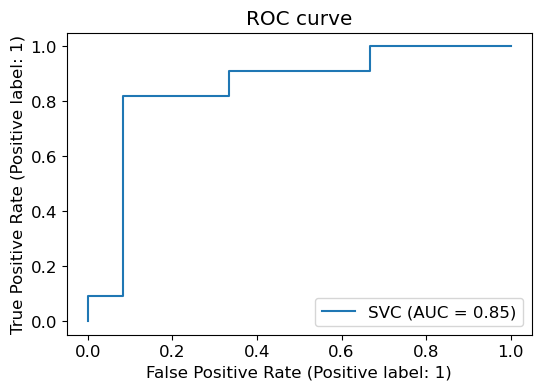

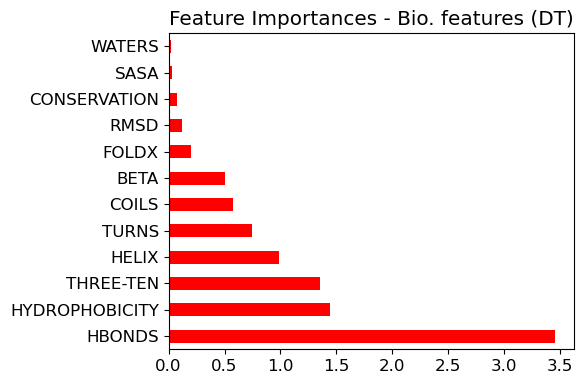

In [46]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll1,output,classifier="SVM",display=display)

/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)


Training sample accuracy
Overall accuracy  0.5384615384615384
Test Accuracy
Overall accuracy  0.391304347826087
                 precision    recall  f1-score   support

non-trafficking       0.42      0.42      0.42        12
    trafficking       0.36      0.36      0.36        11

       accuracy                           0.39        23
      macro avg       0.39      0.39      0.39        23
   weighted avg       0.39      0.39      0.39        23



<Figure size 600x400 with 0 Axes>

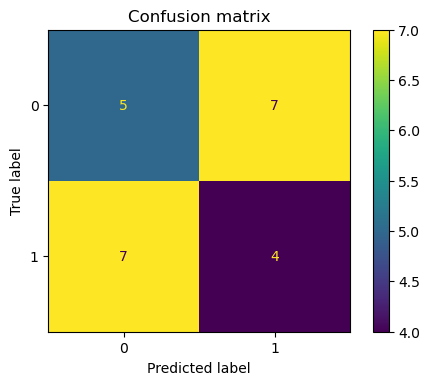

<Figure size 600x400 with 0 Axes>

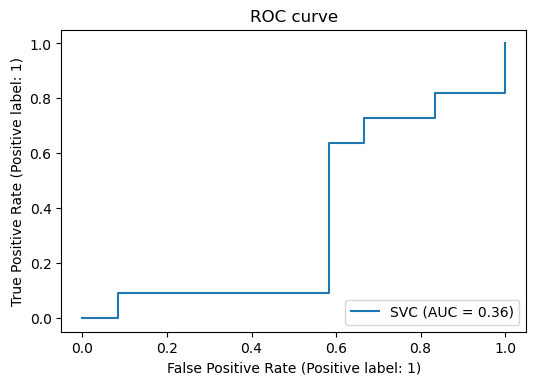

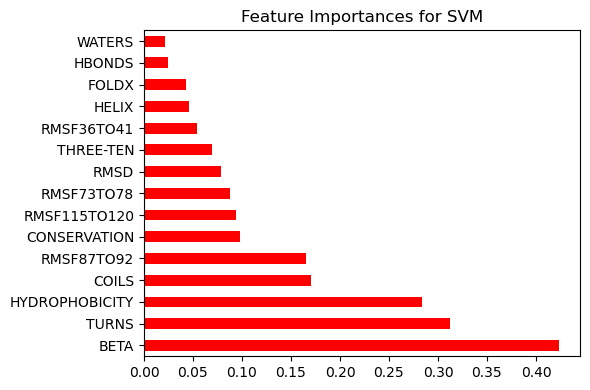

In [38]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll2,output,classifier="SVM",display=display)
mlData['SVM']['All']=outputs

#### plot ROC curves

MD
Bio
All


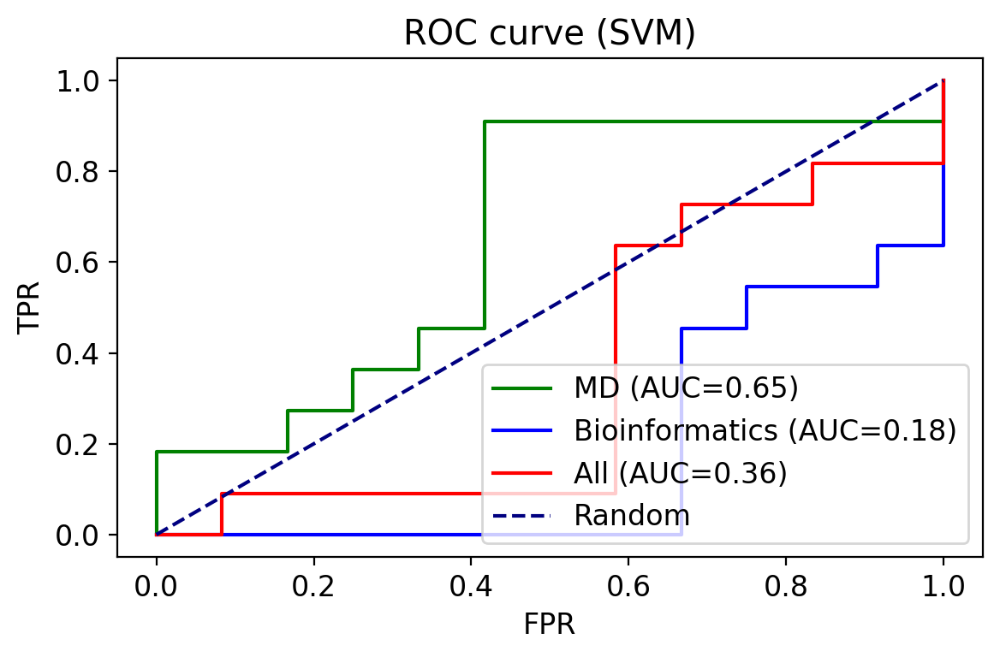

In [48]:
# compare different feature sets
labels=['MD','Bioinformatics','All']
cols=['green','blue','red']

#rcParams['figure.figsize']=7,4
rcParams['font.size']=12
rcParams['figure.dpi']=200
plt.figure()
plt.title('ROC curve (SVM)')
for i,key in enumerate(mlData['SVM'].keys()):
    print(key)
    fpr,tpr,auc=mlData['SVM'][key]['fprs'], mlData['SVM'][key]['tprs'], mlData['SVM'][key]['auc']
    plt.plot(fpr,tpr,label="{} (AUC=%0.2f)".format(labels[i])% auc,color=cols[i])

plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend(loc=4)
plt.tight_layout()
plt.savefig('roc_SVM.png')
rcParams['figure.dpi']=100

/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricW

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.7115384615384616
Test Accuracy
Overall accuracy  0.5217391304347826
                 precision    recall  f1-score   support

non-trafficking       1.00      0.08      0.15        12
    trafficking       0.50      1.00      0.67        11

       accuracy                           0.52        23
      macro avg       0.75      0.54      0.41        23
   weighted avg       0.76      0.52      0.40        23

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall 

/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in lab

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.50      0.25      0.33        12
    trafficking       0.47      0.73      0.57        11

       accuracy                           0.48        23
      macro avg       0.49      0.49      0.45        23
   weighted avg       0.49      0.48      0.45        23

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall 

/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang/anaconda3/lib/python3.

Training sample accuracy
Overall accuracy  0.7115384615384616
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       1.00      0.17      0.29        12
    trafficking       0.52      1.00      0.69        11

       accuracy                           0.57        23
      macro avg       0.76      0.58      0.49        23
   weighted avg       0.77      0.57      0.48        23

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.6730769230769231
Test Accuracy
Overall 

/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang/anaconda3/lib/python3.

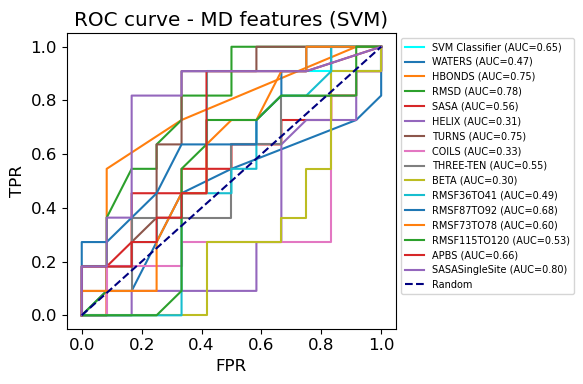

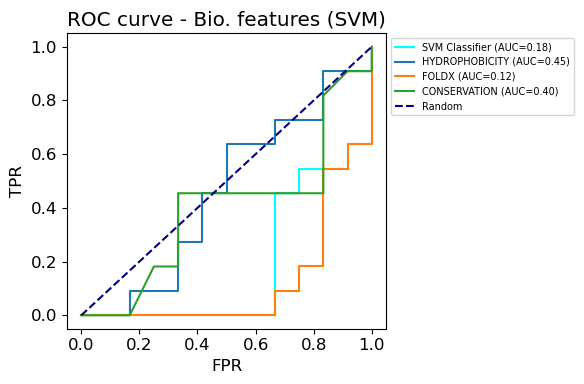

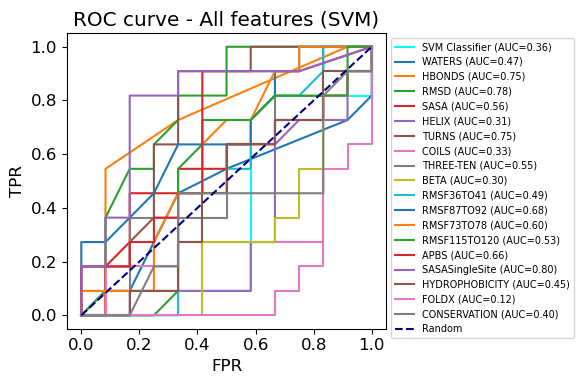

In [56]:
# plot individual features for different feature sets
featSets=[tagsMD2,tagsBio,tagsAll2]
keys=['MD','Bio','All']
labels=['MD', 'Bio.', 'All']
clf='SVM'
rcParams['figure.dpi']=100

for i,key in enumerate(keys):
    feats=featSets[i]    
    plt.figure()
    ax=plt.subplot()
    ax.set_xlabel('FPR')
    ax.set_ylabel('TPR')
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_title('ROC curve - {} features ({})'.format(labels[i], clf))

    # plot classifier ROC
    tpr, fpr, auc = mlData[clf][key]['tprs'], mlData[clf][key]['fprs'], mlData[clf][key]['auc']
    plt.plot (fpr, tpr, color='cyan', label="{} Classifier (AUC=%0.2f)".format(clf)% auc)

    # plot feature ROC
    for feat in feats:
        outputs = mlUtil.MLClassifier(df,[feature],output,classifier=clf, display=False, random_state=random_state)
        tpr, fpr, auc = outputs['tprs'], outputs['fprs'], outputs['auc']
        plt.plot(fpr,tpr,label="{} (AUC=%0.2f)".format(feat)% auc)

    # plot random line
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
    plt.legend(bbox_to_anchor=(1,1), loc='upper left',fontsize=7)
    plt.tight_layout()
    plt.savefig('{}_indiFeature_{}.png'.format(clf,key))

rcParams['figure.dpi']=100

### Classfier performance comparison (F1 score)

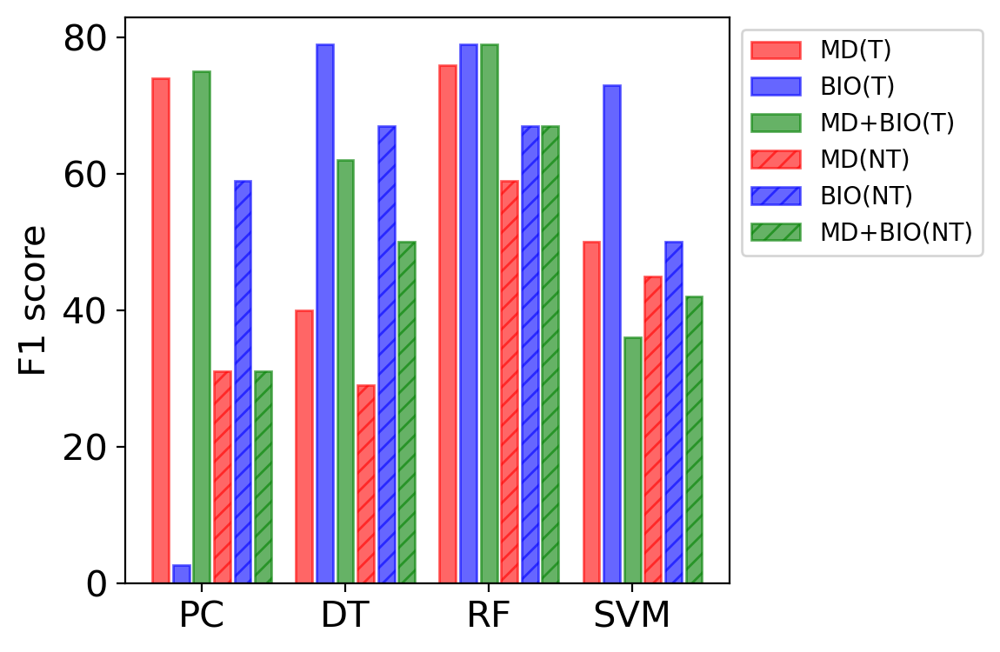

In [154]:
# [MD_T, BIO_T, ALL_T, MD_NT, BIO_NT, ALL_NT]
PCs=[0.74, 0.026, 0.75, 0.31, 0.59, 0.31] 
DTs=[0.40, 0.79, 0.62, 0.29, 0.67, 0.5]
RFs=[0.76, 0.79, 0.79, 0.59, 0.67, 0.67]
SVMs=[0.50, 0.73, 0.36, 0.45, 0.50, 0.42]
allData1=[0.74, 0.026, 0.75, 0.31, 0.59, 0.31,  0, 0.40, 0.79, 0.62, 0.29, 0.67, 0.5,  0,  0.76, 0.79, 0.79, 0.59, 0.67, 0.67,  0,  0.50, 0.73, 0.36, 0.45, 0.50, 0.42]
allData=[i*100 for i in allData1]
cols=['red','blue','green','red','blue','green','white']
labels=['MD(T)', 'BIO(T)', 'MD+BIO(T)', 'MD(NT)', 'BIO(NT)', 'MD+BIO(NT)']
styles=['','','', '///' , '///', '///']

rcParams['figure.dpi']=200
rcParams['font.size']=15
plt.figure()
ax=plt.subplot()
ax.set_ylabel('F1 score')
ax.set_xticks([2,9,16,23])
ax.set_xticklabels(['PC','DT','RF','SVM'])
ax.set_yticks([0, 20, 40, 60, 80, 100])

for i,label in enumerate(labels):
    vals=[]
    xs=[]
    
    for j in range(len(allData)):
        if j % 7 == i:
            vals.append(allData[j])
            xs.append(j)
            
    plt.bar(xs,vals,color=cols[i],alpha=0.6,hatch=styles[i],edgecolor=cols[i],label=label)
    
plt.legend(bbox_to_anchor=(1,1),fontsize=10)
plt.tight_layout()
plt.savefig('f1-scores-trafficking.png')


rcParams['figure.dpi']=100


### Train using best 5 features

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       0.88      0.58      0.70        12
    trafficking       0.67      0.91      0.77        11

       accuracy                           0.74        23
      macro avg       0.77      0.75      0.73        23
   weighted avg       0.78      0.74      0.73        23

k-fold crossvalidation results
[0.75       0.5        0.75       0.875      0.625      0.85714286
 0.71428571 0.42857143 0.71428571 0.71428571] 

results mean
0.6928571428571428 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.782608695652174
                 precision    recall  f1-score   support

non-trafficking       1.00      0.58      0.74        12
    trafficking       0.69      1.00      0.81        11

       accuracy                           0.78        23
      macro avg       0.8

/home/xfang/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)


Training sample accuracy
Overall accuracy  0.8076923076923077
Test Accuracy
Overall accuracy  0.782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.82      0.75      0.78        12
    trafficking       0.75      0.82      0.78        11

       accuracy                           0.78        23
      macro avg       0.78      0.78      0.78        23
   weighted avg       0.79      0.78      0.78        23



<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

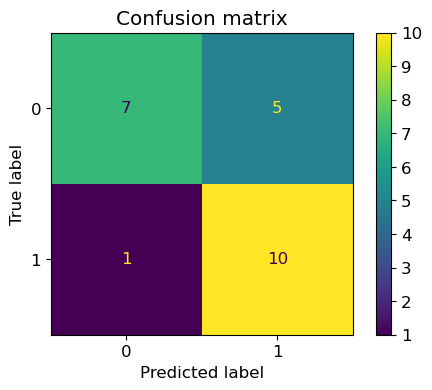

<Figure size 600x400 with 0 Axes>

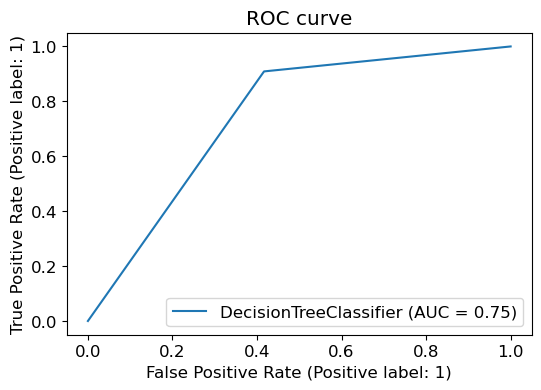

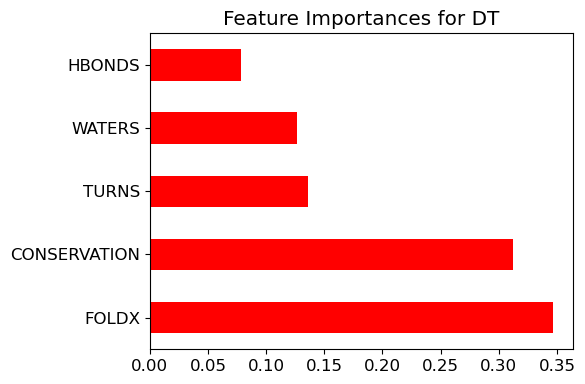

<Figure size 600x400 with 0 Axes>

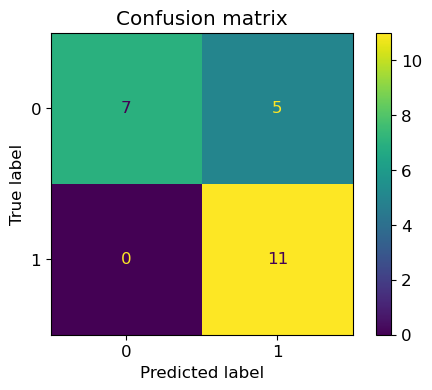

<Figure size 600x400 with 0 Axes>

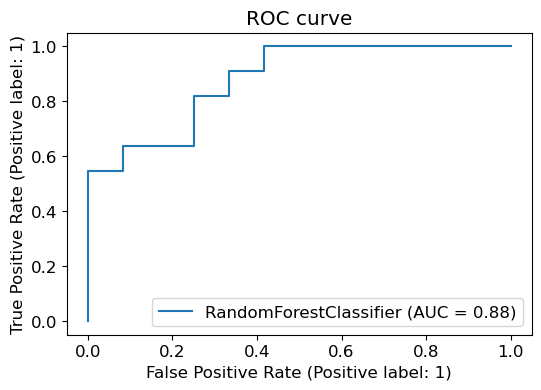

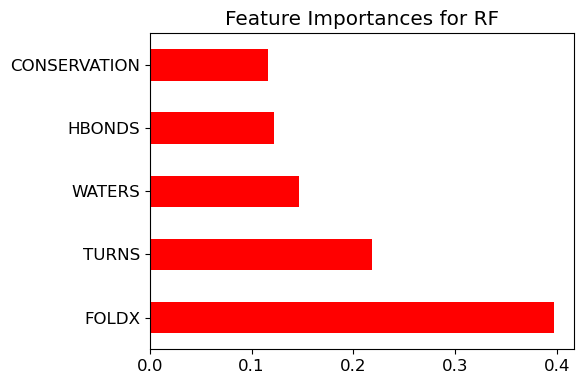

<Figure size 600x400 with 0 Axes>

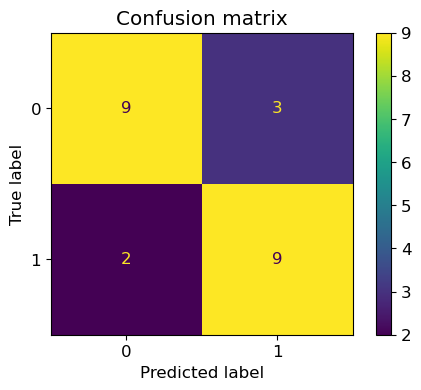

<Figure size 600x400 with 0 Axes>

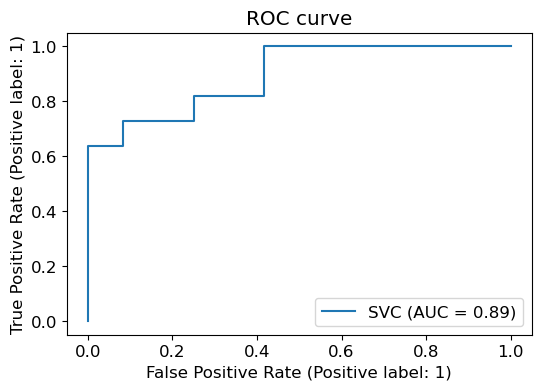

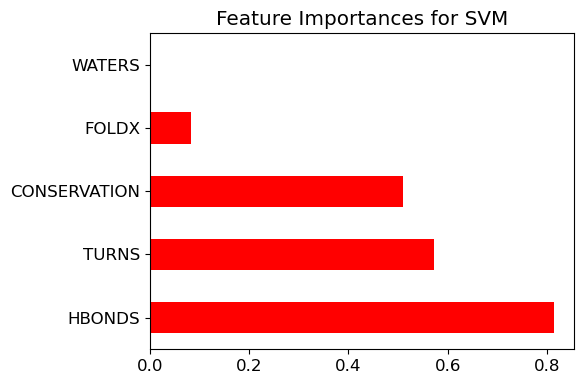

In [69]:
tagsBest=['WATERS','FOLDX','TURNS','HBONDS','CONSERVATION']
clfs=['DT','RF','SVM']
bestData={}

for clf in clfs:
    out=mlUtil.MLClassifier(df,tagsBest,output,classifier=clf,display=display,random_state=random_state) 
    bestData[clf]=out

### Predictions on colume E data

k-fold crossvalidation results
[0.75       0.875      0.75       0.625      0.625      1.
 0.57142857 0.57142857 0.42857143 0.71428571] 

results mean
0.6910714285714286 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23

   VARIANT  Prediction
0     A79T           1
1     C39R           1
2     C49S           1
3    D119H           0
4     D46E           1
5     D46N           0
6     F98L           1
7    L107P           0
8     L87R           1
9    M124I           1
10   M133T           1
11   N117S           1
12   N128S           1
13    R27L           1
14    R35L           1
15    R76H       

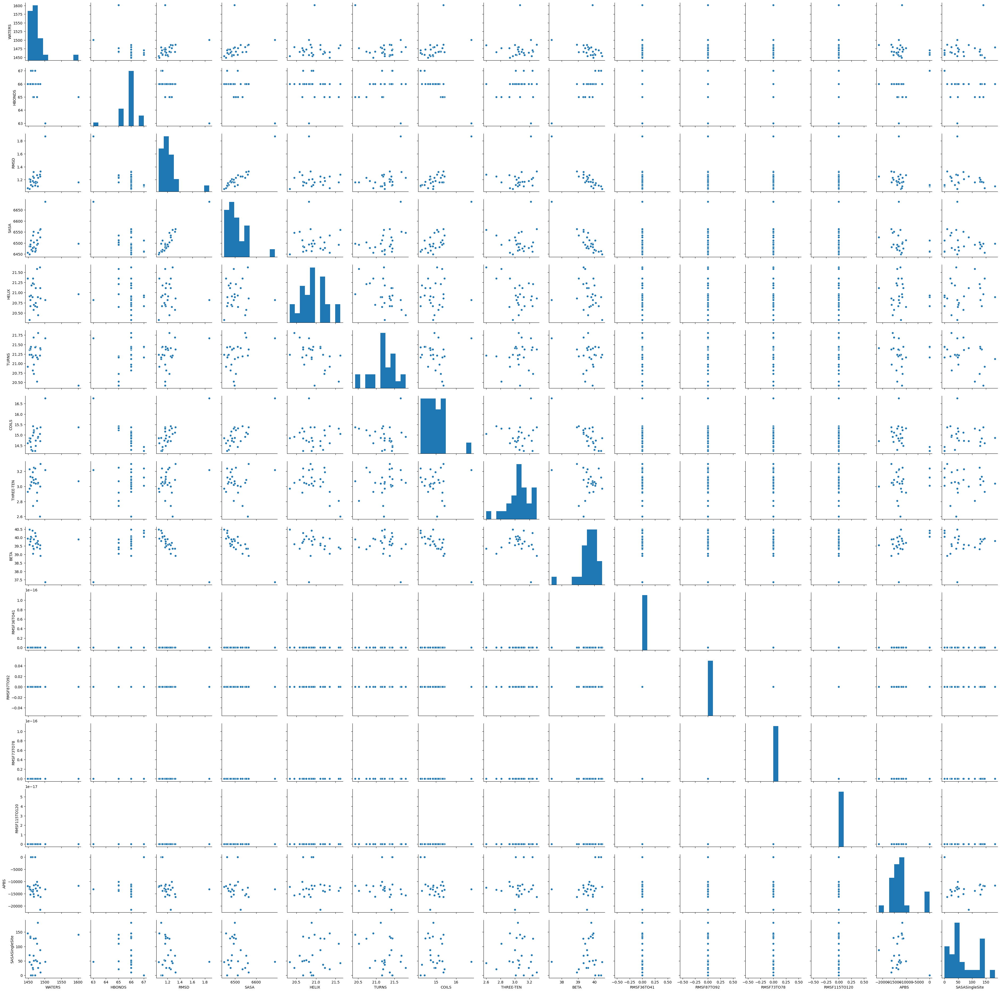

<Figure size 600x400 with 0 Axes>

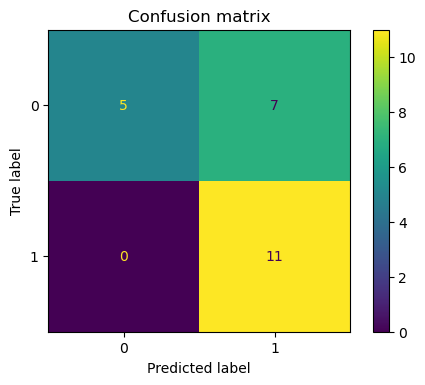

<Figure size 600x400 with 0 Axes>

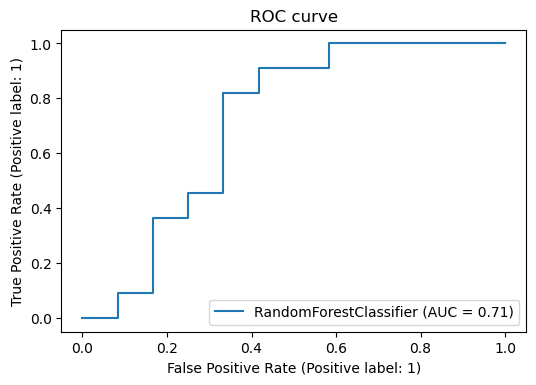

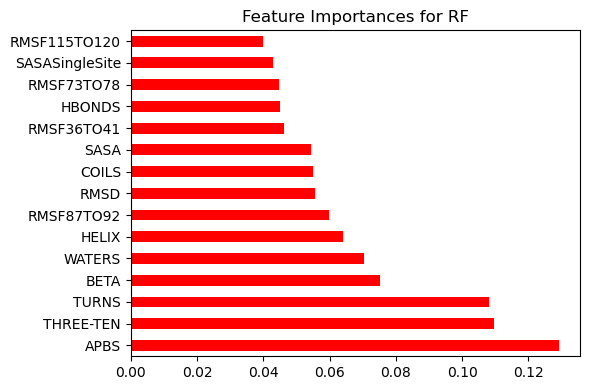

In [21]:
# MD feature set
predictions = mlUtil.MLClassifier(df,tagsMD2,output,classifier="RF",display=display,random_state=random_state,predict=True,dfPred=dfPred) 


In [22]:
# Bio. feature set
predictions = mlUtil.MLClassifier(df,tagsBio,output,classifier="RF",display=display,random_state=random_state,predict=True,dfPred=dfPred) 


k-fold crossvalidation results
[0.75       0.5        0.875      1.         0.75       0.71428571
 0.71428571 0.85714286 0.71428571 0.42857143] 

results mean
0.7303571428571429 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23



KeyError: 'HYDROPHOBICITY'

In [ ]:
# All feature set
predictions = mlUtil.MLClassifier(df,tagsAll2,output,classifier="RF",display=display,random_state=random_state,predict=True,dfPred=dfPred) 


k-fold crossvalidation results
[1.         0.625      0.75       0.75       0.625      0.85714286
 0.71428571 0.57142857 0.71428571 0.71428571] 

results mean
0.7321428571428571 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.782608695652174
                 precision    recall  f1-score   support

non-trafficking       1.00      0.58      0.74        12
    trafficking       0.69      1.00      0.81        11

       accuracy                           0.78        23
      macro avg       0.84      0.79      0.78        23
   weighted avg       0.85      0.78      0.77        23

   VARIANT  Prediction
0     A79T           1
1     C39R           1
2     C49S           1
3    D119H           1
4     D46E           1
5     D46N           1
6     F98L           1
7    L107P           1
8     L87R           1
9    M124I           1
10   M133T           1
11   N117S           1
12   N128S           1
13    R27L           1
14    R35L           1
15    R76H

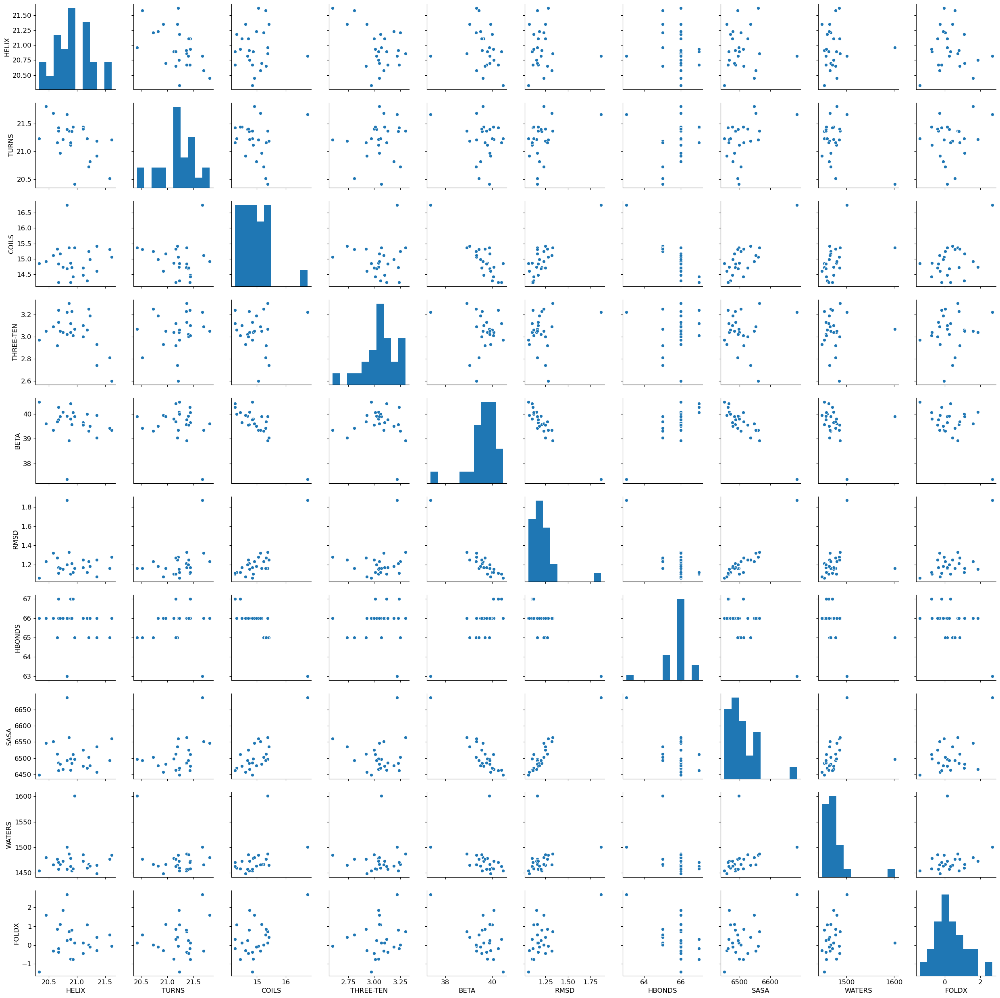

<Figure size 600x400 with 0 Axes>

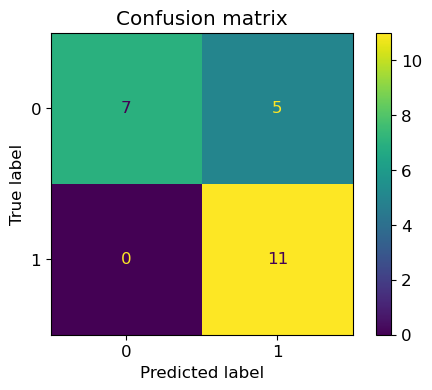

<Figure size 600x400 with 0 Axes>

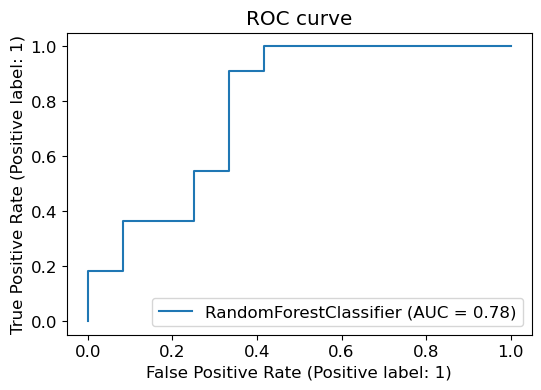

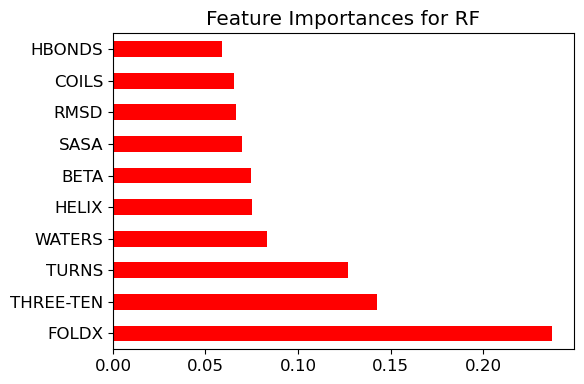

In [67]:
# trimmed feature set
predictData = "feature_sets/cole_dataset.txt"
dfPred=pd.read_csv(predictData, sep="\s+", comment='#')
featuresPred=["HELIX","TURNS","COILS","THREE-TEN","BETA","RMSD","HBONDS","SASA","WATERS","FOLDX"]


predictions = mlUtil.MLClassifier(df,featuresPred,output,classifier="RF",display=display,random_state=random_state,predict=True,dfPred=dfPred) 


R92L  not found in input list
R92L  not found in input list
k-fold crossvalidation results
[1.         0.625      0.75       0.75       0.625      0.85714286
 0.71428571 0.57142857 0.71428571 0.71428571] 

results mean
0.7321428571428571 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23

   VARIANT  Prediction
0     A79T           1
1     C39R           1
2     C49S           1
3    D119H           1
4     D46E           1
5     D46N           1
6     F98L           1
7    L107P           1
8     L87R           1
9    M124I           1
10   M133T           1
11   N117S           1
12   N128S        

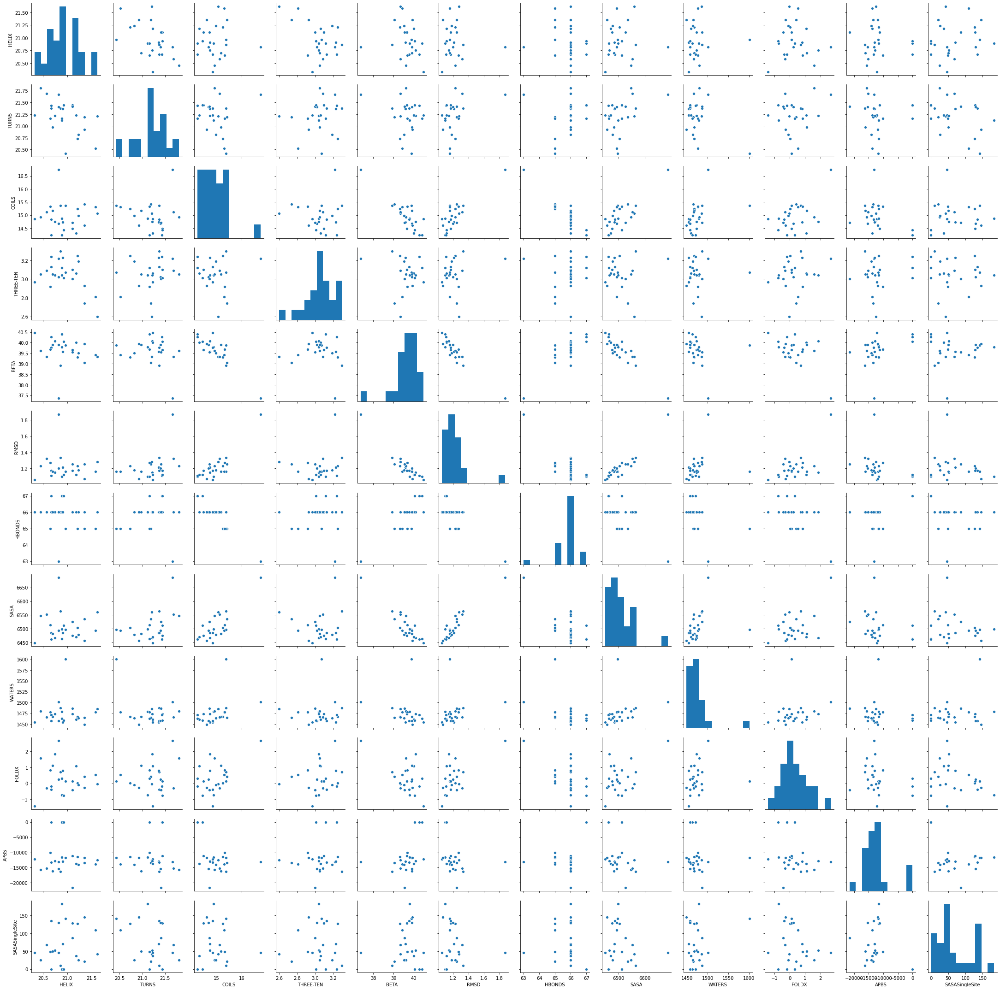

<Figure size 432x288 with 0 Axes>

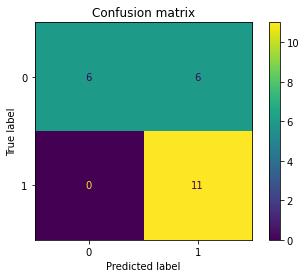

<Figure size 432x288 with 0 Axes>

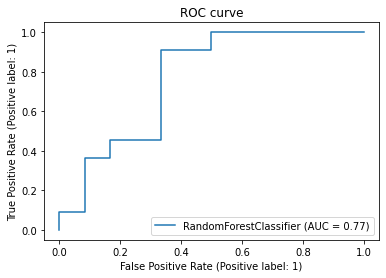

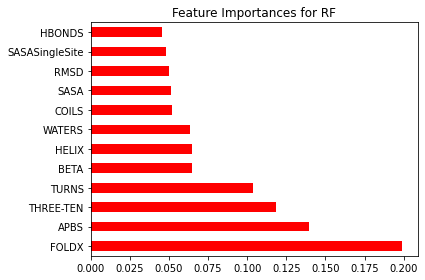

In [71]:
# Use RF and a trimmed feature set to predict on colE data

dfPred=pd.read_csv(predictData, sep="\s+", comment='#')
feature.CalcAPBS(dfPred,'feature_sets/apbs_colE.dat',newTag="APBS")
feature.CalcSASASingleSite(dfPred,'feature_sets/sasaSingleSite_colE.dat',newTag="SASASingleSite")
featuresPred=["HELIX","TURNS","COILS","THREE-TEN","BETA","RMSD","HBONDS","SASA","WATERS","FOLDX","APBS","SASASingleSite"]


predictions = mlUtil.MLClassifier(df,featuresPred,output,classifier="RF",display=display,random_state=random_state,predict=True,dfPred=dfPred) 

R92L  not found in input list
k-fold crossvalidation results
[1.         0.625      0.75       0.75       0.625      0.85714286
 0.71428571 0.57142857 0.71428571 0.71428571] 

results mean
0.7321428571428571 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23

   VARIANT  Prediction
0     A79T           1
1     C39R           1
2     C49S           1
3    D119H           1
4     D46E           1
5     D46N           1
6     F98L           1
7    L107P           1
8     L87R           1
9    M124I           1
10   M133T           1
11   N117S           1
12   N128S           1
13    R27L           1
14

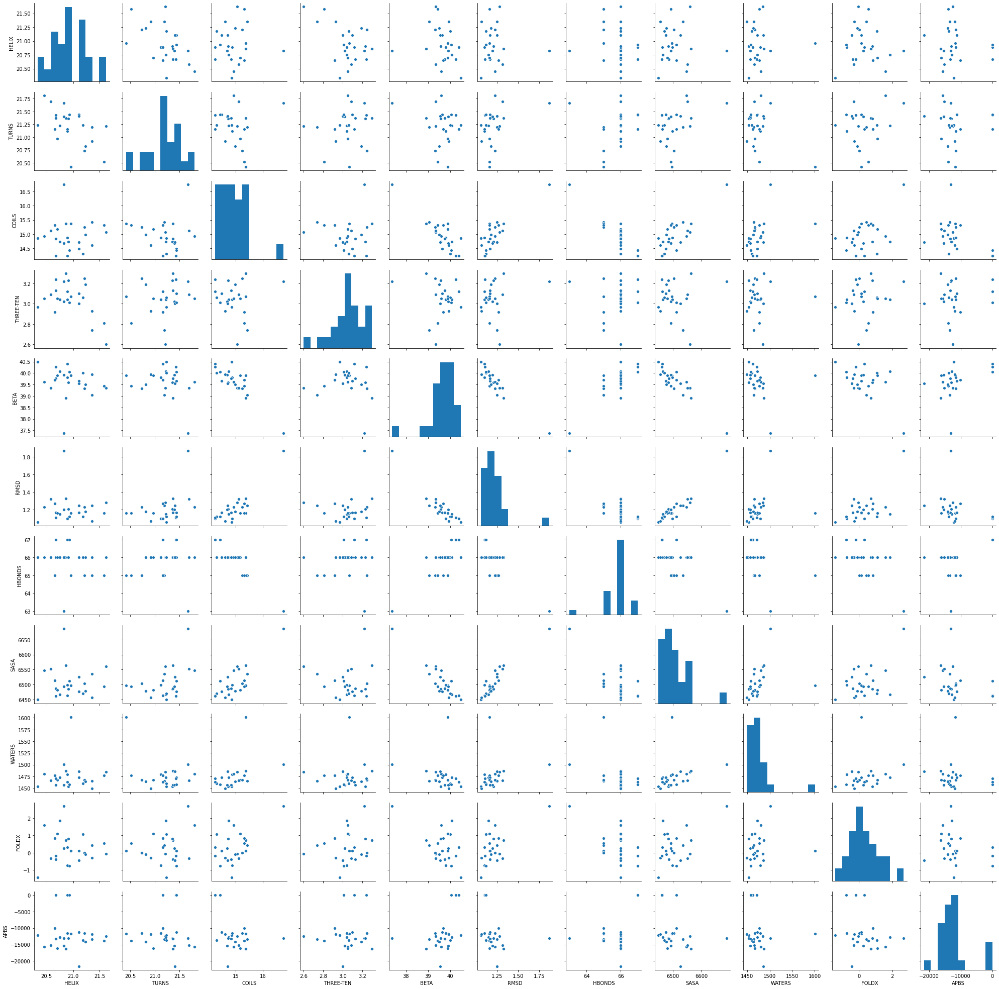

<Figure size 432x288 with 0 Axes>

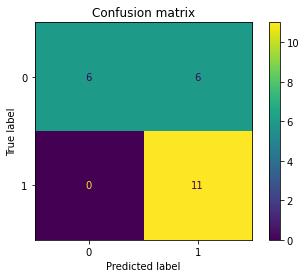

<Figure size 432x288 with 0 Axes>

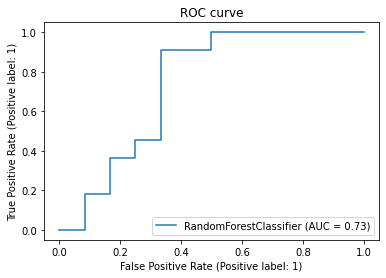

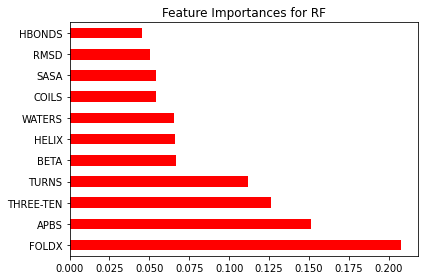

In [72]:
# Use RF and a trimmed feature set to predict on colE data
predictData = "feature_sets/cole_dataset.txt"
dfPred=pd.read_csv(predictData, sep="\s+", comment='#')
feature.CalcAPBS(dfPred,'feature_sets/apbs_colE.dat',newTag="APBS")
featuresPred=["HELIX","TURNS","COILS","THREE-TEN","BETA","RMSD","HBONDS","SASA","WATERS","FOLDX","APBS"]


predictions = mlUtil.MLClassifier(df,featuresPred,output,classifier="RF",display=display,random_state=random_state,predict=True,dfPred=dfPred) 

### Misc 
[under construction]

In [ ]:
case = cases["Prob"]
print("WARNING, IM NOT COMPUTING THE FPRs correctly")
case['fprs'] = case['fnrs']
plt.plot(case['fprs'],case['tprs'], label="Prob")

case = cases["DT"]
plt.plot(case['fprs'],case['tprs'], label="DT, auc=%f"%case['auc'])

case = cases["RF"]
plt.plot(case['fprs'],case['tprs'], label="RF, auc=%f"%case['auc'])

plt.legend()


*Displaying* features for all variants

Some complicated sorting

In [ ]:
df_alpha = df.sort_values(by='VARIANT') # alphabetically 

#df['position']
import re 

# finds all numbers in variant (position) 
nums = [re.findall(r'\d+',x) for x in df['VARIANT']]
#(lambda x: x[0] if len(x)>0 else 0)(nums)

# ugly, but returns the first number in each element, if defined, zero otherwise (for wt)
tables = [lambda x=x: int(x[0]) if len(x)>0 else 0 for x in nums]

df['Positions'] = [table() for table in tables]

df_seq = df.sort_values(by='Positions') # alphabetically 
df_seq.head()

In [ ]:
def zscore(xs):
  zs = xs - np.mean(xs)
  zs /= np.std(xs)
  return zs

def CalcFeatureMatrix(ldf):
  nVar = len(ldf['VARIANT'])   
  featureMatrix = np.zeros([nVar,len(tags)+1]) # added tag for trafficking  

  for i,tag in enumerate(tags):
    v = zscore(ldf[tag])
    featureMatrix[:,i] = v
  featureMatrix[:,len(tags)] = ldf['TRAFFICKING']

  l = np.where(ldf["VARIANT"] == 'wt')[0]
  wtVal = featureMatrix[l,]
  featureMatrix = np.subtract(featureMatrix,wtVal)

  return featureMatrix

import matplotlib as mpl
def DisplayFeatureMatrix(ldf, featureMatrix):
  daMin = np.min(featureMatrix)
  daMax = np.max(featureMatrix)
  print(tags)
  fig, ax = plt.subplots()
  #fig.subplots_adjust(bottom=0.5)
  #cmap = mpl.cm.cool
  norm = mpl.colors.Normalize(vmin=daMin, vmax=daMax)

  print("TRAFFIC: ")
  l = np.where(ldf["TRAFFICKING"] == 1)
  traf = ldf[ldf['TRAFFICKING']==1]
  for i,j in enumerate(traf['VARIANT']):
    print(j+" (%d) "%i,end="")
  tr = featureMatrix[l,:]
  ax.pcolormesh(tr[0,:,:])
  fig.colorbar(mpl.cm.ScalarMappable(norm=norm))
  ax.set_title("traffics")

  print("\nNONTRAFFIC: ")
  fig, ax = plt.subplots()
  l = np.where(ldf["TRAFFICKING"] == 0)
  traf = ldf[ldf['TRAFFICKING']==0]
  for i,j in enumerate(traf['VARIANT']):
    print(j+" (%d) "%i,end="")
  tr = featureMatrix[l,:]
  ax.pcolormesh(tr[0,:,:])
  fig.colorbar(mpl.cm.ScalarMappable(norm=norm))
  ax.set_title("no traffics")

featureMatrix = CalcFeatureMatrix(df_seq)
DisplayFeatureMatrix(df_seq,featureMatrix)

In [ ]:
df['Positions'].hist()

traf = df[df['TRAFFICKING']==1]
traf['Positions'].hist()

plt.figure()
nontraf = df[df['TRAFFICKING']==0]
nontraf['Positions'].hist()

In [ ]:
df_seq[df_seq['TRAFFICKING']==0]

In [ ]:
temp = df_seq[df_seq['Positions']==74]
temp[['VARIANT','TRAFFICKING']]

Plotting of correlation plots

In [ ]:

#cp /content/herg/*.txt /content/drive/MyDrive/herg-local/

In [ ]:
import numpy as np
xs = np.linspace(0,1,10)
df = pd.DataFrame()
trafix = np.zeros_like(xs)
trafix[::2]=1
df['CLASS'] = trafix
df['A'] = xs*2 + np.random.rand(len(xs))
df['B'] = xs*1 + np.random.rand(len(xs))
df['C'] = -xs + np.random.rand(len(xs))
df['D'] =  np.random.rand(len(xs))

ndf = df[ df['CLASS']==0]

features = ["A", "B", "C", "D"]
idx = len(features)
#df['']
fig, axs = plt.subplots(idx, idx, sharex=True, sharey=True)

for i, featurei in enumerate(features):
  for j, featurej in enumerate(features):
    if i < j:
       axs[i, j].axis('off')

    #print(featurei, featurej)
    else:
      axs[i, j].scatter(
          df[featurei],df[featurej],
          color='b'
          )
      axs[i, j].scatter(
          ndf[featurei],ndf[featurej],
          color='r'
          )
    if j==0: 
       axs[i, j].set_ylabel(featurei)

Quasi-bootstrapping example
Repeat the following 'n' times:
- Divide set into training/testing (not done in general, but suitable for this)
- Compute statistic of interest  (s)
- Store statistic

Then: 
- compute smean from avg( s1...sn ) 
- rank order {s1..sn}
- use 5th percentile as s5th, 95th percentile as s95th
- report s5th, smean, s95

  

In [ ]:
import numpy as np

pts = np.random.randn(1000) # mean zero numbers
iters = 10000
means = np.zeros(iters)

for i in range(iters):
  itersTraining = int(0.7 * iters)
  ptsi = np.random.choice(pts,itersTraining) # random w replacement
  # use my probability-based classifier to get ROC curve
  ptsi # do stuff
  # train with ptsi 
  itersTest = int(0.3 * iters)
  ptsj = np.random.choice(pts,itersTest) # random w replacement
  ptsj # do stuff

  # you'll want to store a matrix of ROC curves (length iters)  
  means[i] = np.mean( ptsi )


Bootstrapped

In [ ]:
sorted = np.sort(means)
da5th = int(iters * 0.05)
da95th = int(iters * 0.95)

print("Mean %f"% np.mean(sorted))
print("Conf interval [%f,%f]"%( sorted[da5th],  sorted[da95th]))


Standard (using original sample)

In [ ]:
print("Mean %f"% np.mean(pts))
print("Conf interval [%f,%f]" %(np.mean(pts) - np.std(pts)/np.sqrt(iters), np.mean(pts) + np.std(pts)/np.sqrt(iters)))


In [ ]:
da95th

In [ ]:
len(df)